Monta Google Drive, paso previo a la carga de librerías y datos de la celda siguiente.


In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


## 0. Librerías y carga de datos

**Setup del entorno.** Carga las librerías del pipeline completo: manejo de datos (`pandas`/`numpy`), diagnóstico estadístico (`statsmodels`, VIF), econometría espacial (`libpysal`, `esda`, `spreg` para SEM/SAR/SARAR), GWR (`mgwr`) y el modelo no paramétrico de validación (`xgboost` + `shap`). `mgwr` no viene preinstalado en el runtime de Colab, por eso el `try/except` lo instala on-the-fly si falta — evita tener que correr una celda de `!pip install` aparte y que el notebook falle si se ejecuta desde cero en una sesión nueva.

In [ ]:
# ── 0. LIBRERÍAS ──────────────────────────────────────────────────────────
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import warnings
import time
from scipy import stats

from statsmodels.stats.outliers_influence import variance_inflation_factor
from statsmodels.tools.tools import add_constant
import statsmodels.api as sm
import statsmodels.formula.api as smf
from sklearn.metrics import r2_score, mean_squared_error
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import KFold, cross_val_score
from scipy.spatial import cKDTree
from matplotlib.colors import TwoSlopeNorm

import xgboost as xgb
import shap

from libpysal.weights import KNN
from esda.moran import Moran
from spreg import OLS as SPREG_OLS
from spreg import GM_Error, GM_Lag, GM_Combo

try:
    from mgwr.gwr import GWR
    from mgwr.sel_bw import Sel_BW
    print('mgwr disponible')
except ImportError:
    import subprocess
    subprocess.run(['pip', 'install', 'mgwr', '--quiet'])
    from mgwr.gwr import GWR
    from mgwr.sel_bw import Sel_BW
    print('mgwr instalado')

print('Librerías cargadas.')

mgwr disponible
Librerías cargadas.


In [ ]:
# ── 1. CARGA DE DATOS ─────────────────────────────────────────────────────
df = pd.read_csv('/content/drive/MyDrive/Catastro/dataset_ingenieria_caracteristicas.csv',
                  dtype={'barmanpre': str})

if 'ph_bin' not in df.columns and 'es_PH' in df.columns:
    df['ph_bin'] = df['es_PH']
if 'log_valor_avaluo' not in df.columns and 'log_valor' in df.columns:
    df['log_valor_avaluo'] = df['log_valor']

# ── AGREGACIÓN PH POR SUMATORIA ──────────────────────────────────────────
# El CSV llega agregado por barmanpre con el avalúo y el área construida como
# PROMEDIO de los chips del lote. La especificación del modelo es por
# SUMATORIA: suma = promedio * n_chips_por_lote. La unidad de análisis pasa a
# ser el lote completo (edificio entero) y la elasticidad del área captura la
# escala en vez de normalizarla.
# area_terreno_2026 NO se toca: a nivel lote ya es el área total del predio.
def log_seguro(serie):
    """log natural tratando los valores <= 0 y no finitos como faltantes.

    np.log(0) devuelve -inf y np.log(negativo) devuelve NaN con RuntimeWarning.
    Los -inf NO son detectados por dropna() ni notnull(), asi que se cuelan
    hasta las descomposiciones matriciales y hacen fallar VIF, OLS, GM_Lag y
    GWR con 'SVD did not converge' o 'input arrays have missing/NaN values'.
    Esta funcion los convierte en NaN para que el manejo de faltantes del
    pipeline los trate de forma uniforme y visible.
    """
    s = pd.to_numeric(serie, errors='coerce')
    s = s.where(s > 0)                       # <= 0 y NaN -> NaN
    return np.log(s)


df['valor_avaluo_sum']        = df['valor_avaluo_2026'] * df['n_chips_por_lote']
df['area_construida_sum']     = df['area_construida_2026'] * df['n_chips_por_lote']
df['log_valor_sum']           = log_seguro(df['valor_avaluo_sum'])
df['log_area_construida_sum'] = log_seguro(df['area_construida_sum'])
df['log_n_chips']             = log_seguro(df['n_chips_por_lote'])

# ── DIAGNÓSTICO DE VALORES NO FINITOS ────────────────────────────────────
# np.log(0) devuelve -inf, no NaN. Como dropna() y notnull() NO detectan
# ±inf, esos valores se cuelan hasta las descomposiciones matriciales y
# hacen fallar el VIF, el OLS y el GWR con "SVD did not converge".
# Se diagnostica el origen y se convierte ±inf en NaN para que el manejo de
# faltantes del pipeline los capture de forma uniforme.
print('=== DIAGNÓSTICO DEL DENOMINADOR DE LA AGREGACIÓN ===')
print(f'n_chips_por_lote nulo   : {df["n_chips_por_lote"].isna().sum()}')
print(f'n_chips_por_lote <= 0   : {(df["n_chips_por_lote"] <= 0).sum()}')
print(f'valor_avaluo_2026 <= 0  : {(df["valor_avaluo_2026"] <= 0).sum()}')
print(f'area_construida_2026 <=0: {(df["area_construida_2026"] <= 0).sum()}')

_cols_log = ['log_valor_sum', 'log_area_construida_sum', 'log_n_chips',
             'log_valor_avaluo', 'log_area_construida', 'log_area_terreno']
print('\n=== VALORES NO FINITOS POR COLUMNA ===')
for _c in _cols_log:
    if _c in df.columns:
        _s = df[_c]
        print(f'  {_c:<26} NaN={_s.isna().sum():>5}  '
              f'-inf={np.isneginf(_s).sum():>5}  +inf={np.isposinf(_s).sum():>5}')

_problema = df[
    (df['n_chips_por_lote'] <= 0) | df['n_chips_por_lote'].isna()
    | (df['valor_avaluo_2026'] <= 0) | (df['area_construida_2026'] <= 0)
]
if len(_problema):
    print(f'\n{len(_problema)} lote(s) con insumos inválidos para la agregación:')
    display(_problema[['barmanpre', 'n_chips_por_lote', 'ph_bin',
                       'valor_avaluo_2026', 'area_construida_2026']].head(20))
    print('Estos lotes no admiten agregación por sumatoria (n_chips debe ser')
    print('>= 1 por construcción). Se marcan como faltantes y quedan fuera')
    print('del modelo vía mask; revisar su origen en el notebook de agregación.')

# ±inf -> NaN para que dropna()/notnull() los traten como faltantes
for _c in ['log_valor_sum', 'log_area_construida_sum', 'log_n_chips']:
    df[_c] = df[_c].replace([np.inf, -np.inf], np.nan)

print(f'\nFaltantes tras el saneamiento:')
print(f'  log_valor_sum           : {df["log_valor_sum"].isna().sum()}')
print(f'  log_area_construida_sum : {df["log_area_construida_sum"].isna().sum()}')

print(f'Shape: {df.shape}')
print(f'Lotes unicos: {df["barmanpre"].nunique():,}')
display(df.head())


## 1. Definición de features

**Definición del set de features finales del modelo.** Aquí se fija la especificación que van a compartir OLS, SEM/SAR/SARAR, GWR y XGBoost, para que los tres enfoques sean comparables sobre las mismas variables. Los predictores numéricos van en log (área, distancias) para linealizar relaciones y estabilizar varianza; `cx`/`cy` son las coordenadas para capturar tendencia espacial gruesa antes de meter la matriz W. Las dummies `dest_*` (destino/uso del predio) se agregan dinámicamente desde las columnas del DataFrame en vez de listarlas a mano, para que el set de features no quede desincronizado si cambia el umbral de agrupación de categorías raras (ver más adelante la comparación umbral 100 vs 30). Las dummies `uso_`, `iso_`, `est_iso_` se excluyen explícitamente del modelo principal — son variables candidatas descartadas (uso real vs destino catastral, bandas de isócrona) que se usan en otros análisis exploratorios del notebook, no en el modelo final.

In [ ]:
# ── 2. DEFINIR FEATURES ───────────────────────────────────────────────────
# Especificación del modelo:
#   - agregación de PH por SUMATORIA (avalúo y área construida)
#   - SIN PreEstrato
FEATURES_NUM_FINAL = [
    'log_area_terreno',
    'log_area_construida_sum',
    'log_dist_estacion_metro_m',
    'log_dist_viaducto_m',
    'log_dist_tm_m',
    'log_dist_parques_m',
    'log_dist_salud_m',
    'log_dist_educacion_m',
    'cx',
    'cy',
    'ph_bin',
]

TARGET  = 'log_valor_sum'
EPSILON = 1e-6

DEST_DUMMIES = [c for c in df.columns if c.startswith('dest_')]
print(f'Dummies de destino incluidas en el modelo: {len(DEST_DUMMIES)}')
print(DEST_DUMMIES)

FEATURES_FINAL = FEATURES_NUM_FINAL + DEST_DUMMIES

FEATURES_CAT_FINAL = [
    'estacion_metro_cercana',
    'estacion_tm_cercana',
]

DUMMIES_EXCLUIDAS = [c for c in df.columns if any(
    c.startswith(p) for p in ['uso_', 'iso_', 'est_iso_']
)]
print(f'Dummies excluidas del modelo principal: {len(DUMMIES_EXCLUIDAS)}')
print(f'\nTARGET   : {TARGET}')
print(f'PreEstrato en el modelo: {"PreEstrato" in FEATURES_FINAL}')

## 2. Análisis exploratorio

### Estadísticas descriptivas, nulos, correlaciones y VIF

Batería estándar de diagnóstico exploratorio sobre el set de features definido arriba: estadísticas descriptivas de numéricas y categóricas, conteo de nulos, correlación de cada predictor con el target (`log_valor_avaluo`) con su gráfico de barras, heatmap de correlaciones cruzadas, y Variance Inflation Factor (VIF) para detectar multicolinealidad entre predictores antes de ajustar cualquier modelo.


In [ ]:
# ── 3. ESTADÍSTICAS DESCRIPTIVAS ──────────────────────────────────────────
print('=== NUMÉRICAS ===')
display(df[FEATURES_NUM_FINAL + [TARGET]].describe().T)

print('\n=== CATEGÓRICAS ===')
for col in FEATURES_CAT_FINAL:
    print(f'{col}: {df[col].nunique()} categorías | nulos: {df[col].isnull().sum()}')

=== NUMÉRICAS ===


,count,mean,std,min,25%,50%,75%,max
log_area_terreno,16613.0,4.893697,1.158930,-3.218876,4.573060,5.128122,5.506956,10.946147
log_area_construida,16599.0,5.288047,1.258058,0.000000,5.005221,5.494706,5.905239,10.950002
log_dist_estacion_metro_m,16613.0,6.832444,0.503942,3.478014,6.581626,6.956879,7.198815,7.595791
log_dist_viaducto_m,16613.0,6.085544,0.804393,3.031156,5.692542,6.285932,6.689161,7.234181
log_dist_tm_m,16613.0,6.328432,0.635246,3.349681,5.943431,6.424470,6.829107,7.486850
log_dist_parques_m,16613.0,4.796910,0.877598,0.000000,4.346091,4.945145,5.433336,6.534154
log_dist_salud_m,16613.0,4.811937,0.870673,0.000002,4.371233,4.919545,5.367880,6.637435
log_dist_educacion_m,16613.0,5.238060,0.677312,2.008177,4.830137,5.314871,5.744926,6.813908
cx,16613.0,101365.278470,591.524907,100066.157933,100912.654635,101292.241626,101772.756582,102973.877855
cy,16613.0,106549.600935,1027.745129,104451.104433,105698.383159,106489.359103,107475.042916,108656.032616



=== CATEGÓRICAS ===
estacion_metro_cercana: 2 categorías | nulos: 0
estacion_tm_cercana: 9 categorías | nulos: 0


In [ ]:
# ── 4. NULOS ──────────────────────────────────────────────────────────────
nulos = (
    df[FEATURES_NUM_FINAL + FEATURES_CAT_FINAL + [TARGET]]
    .isnull().sum().rename('nulos').to_frame()
)
nulos['%'] = (nulos['nulos'] / len(df) * 100).round(2)
nulos = nulos[nulos['nulos'] > 0].sort_values('nulos', ascending=False)
print('Columnas con nulos:')
display(nulos)

Columnas con nulos:


,nulos,%
log_area_construida,14,0.08


,correlacion,abs
log_area_terreno,0.883991,0.883991
log_area_construida,0.682291,0.682291
ph_bin,-0.370667,0.370667
PreEstrato,-0.342508,0.342508
cx,0.107433,0.107433
log_dist_educacion_m,-0.103142,0.103142
log_dist_salud_m,-0.099391,0.099391
log_dist_viaducto_m,-0.097237,0.097237
log_dist_tm_m,-0.086847,0.086847
log_dist_estacion_metro_m,-0.072285,0.072285


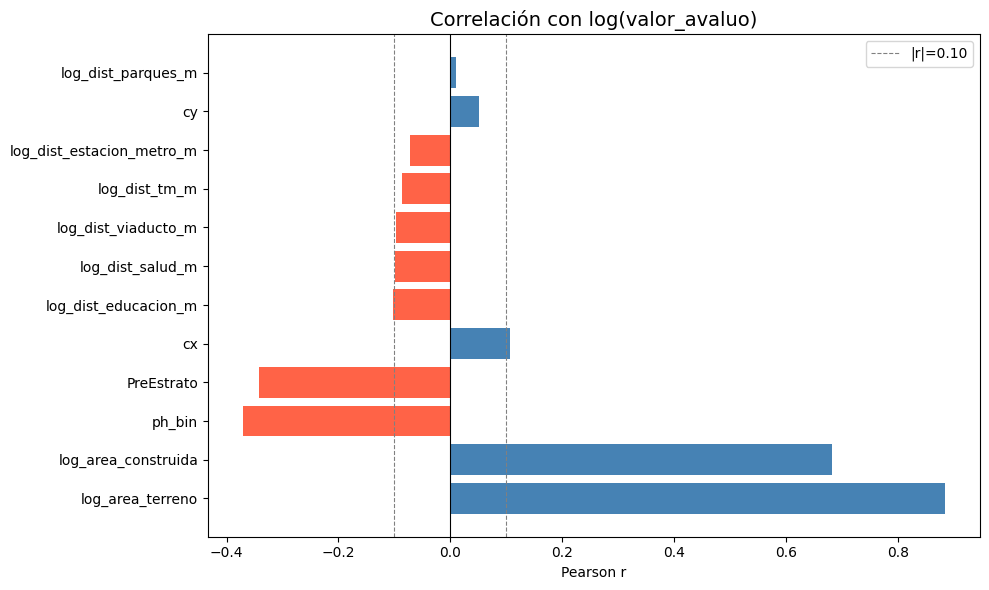

In [ ]:
# ── 5. CORRELACIÓN CON EL TARGET ──────────────────────────────────────────
corr_target = (
    df[FEATURES_NUM_FINAL + [TARGET]]
    .corr()[TARGET]
    .drop(TARGET)
    .sort_values(key=abs, ascending=False)
    .to_frame()
    .rename(columns={TARGET: 'correlacion'})
)
corr_target['abs'] = corr_target['correlacion'].abs()
display(corr_target)

fig, ax = plt.subplots(figsize=(10, 6))
colors = ['steelblue' if v >= 0 else 'tomato' for v in corr_target['correlacion']]
ax.barh(corr_target.index, corr_target['correlacion'], color=colors)
ax.axvline(0,    color='black', linewidth=0.8)
ax.axvline(0.1,  color='gray',  linewidth=0.8, linestyle='--', label='|r|=0.10')
ax.axvline(-0.1, color='gray',  linewidth=0.8, linestyle='--')
ax.set_title('Correlación con log(valor_avaluo)', fontsize=14)
ax.set_xlabel('Pearson r')
ax.legend()
plt.tight_layout()
plt.show()

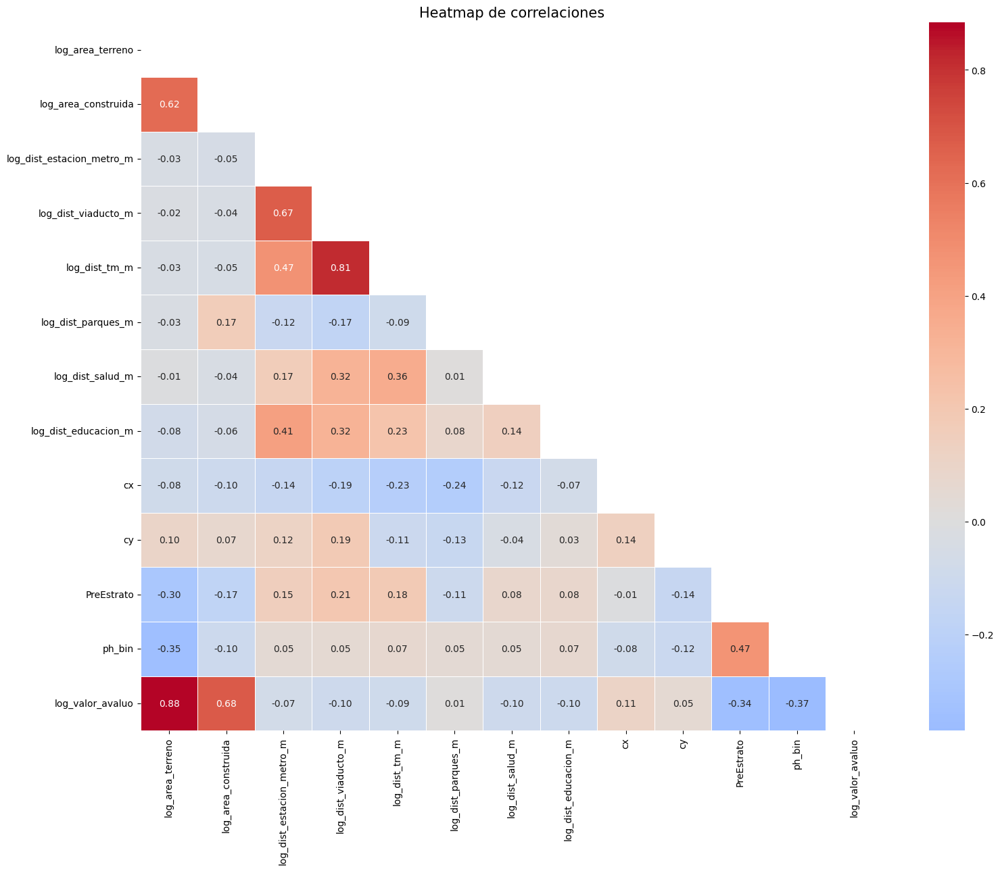

In [ ]:
# ── 6. HEATMAP DE CORRELACIONES ───────────────────────────────────────────
corr_matrix = df[FEATURES_NUM_FINAL + [TARGET]].corr()
mask_tri = np.triu(np.ones_like(corr_matrix, dtype=bool))

fig, ax = plt.subplots(figsize=(16, 13))
sns.heatmap(corr_matrix, mask=mask_tri, annot=True, fmt='.2f',
            cmap='coolwarm', center=0, linewidths=0.5, ax=ax)
ax.set_title('Heatmap de correlaciones', fontsize=15)
plt.tight_layout()
plt.show()

In [ ]:
# ── 7. VIF ────────────────────────────────────────────────────────────────
# dropna() no elimina ±inf: se filtra explícitamente por finitud, si no el
# cálculo del VIF falla con "SVD did not converge".
df_vif = df[FEATURES_NUM_FINAL].copy()
_finito = np.isfinite(df_vif.to_numpy(dtype=float)).all(axis=1)
print(f'Filas descartadas del VIF por nulos o infinitos: {(~_finito).sum()}')
df_vif = df_vif[_finito]
X_vif  = add_constant(df_vif)

vif_df = pd.DataFrame({
    'feature': X_vif.columns,
    'VIF': [variance_inflation_factor(X_vif.values, i) for i in range(X_vif.shape[1])]
}).set_index('feature').drop('const')

vif_df = vif_df.sort_values('VIF', ascending=False)
vif_df['alerta'] = vif_df['VIF'].apply(
    lambda v: '🔴 ALTO' if v > 10 else ('🟡 MEDIO' if v > 5 else '🟢 OK')
)
display(vif_df)

fig, ax = plt.subplots(figsize=(10, 6))
colors = ['tomato' if v > 10 else ('orange' if v > 5 else 'steelblue') for v in vif_df['VIF']]
ax.barh(vif_df.index, vif_df['VIF'], color=colors)
ax.axvline(5,  color='orange', linestyle='--', label='VIF=5')
ax.axvline(10, color='red',    linestyle='--', label='VIF=10')
ax.set_title('Variance Inflation Factor (VIF)', fontsize=14)
ax.legend()
plt.tight_layout()
plt.show()

## 3. Agregación de propiedad horizontal por barmanpre

### Diagnóstico a nivel lote y copia de trabajo

Confirma la proporción de lotes PH vs. NPH dominante tras la agregación por `barmanpre` (Notebook `Manipulacion_datos_pre_modelo`), y crea `df_modelo` como copia de trabajo de `df` sobre la que se construyen todos los modelos de esta sección.


In [ ]:
# ── 10. DIAGNOSTICO NIVEL LOTE ───────────────────────────────────────────

n_ph  = (df['ph_bin'] == 1).sum()
n_nph = (df['ph_bin'] == 0).sum()

print(f'Lotes totales                : {len(df):,}')
print(f'  Lotes PH  (dominante)      : {n_ph:,}  ({n_ph/len(df)*100:.1f}%)')
print(f'  Lotes NPH (dominante)      : {n_nph:,} ({n_nph/len(df)*100:.1f}%)')
print(f'Chips originales representados: {df["n_chips"].sum():,}' if 'n_chips' in df.columns else '')


Lotes totales                : 16,613
  Lotes PH  (dominante)      : 11,583  (69.7%)
  Lotes NPH (dominante)      : 5,030 (30.3%)



In [ ]:
# ── 11. DATASET DEL MODELO (ya agregado por barmanpre) ────────────────────
df_modelo = df.copy()
print(f'df_modelo: {df_modelo.shape}')
print(f'Nulos TARGET: {df_modelo[TARGET].isnull().sum()}')


df_modelo: (16613, 70)
Nulos TARGET: 0


## 4. Dataset del modelo (solo eje: precios y distancias)


Aplica el set de `FEATURES_FINAL` sobre `df_modelo`, separando `X`/`y` y descartando las filas con nulos en cualquier feature o en el target — este `X`/`y` (y la máscara `mask`) es el insumo compartido de OLS, SEM/SAR/SARAR y XGBoost.


In [ ]:
# ── 13. DATASET FINAL ─────────────────────────────────────────────────────
X = df_modelo[FEATURES_FINAL].copy()
y = df_modelo[TARGET]

# notnull() deja pasar ±inf. El mask se construye por finitud para que los
# valores infinitos generados por log(0) no lleguen a las estimaciones.
mask = (np.isfinite(X.to_numpy(dtype=float)).all(axis=1)
        & np.isfinite(y.to_numpy(dtype=float)))
mask = pd.Series(mask, index=X.index)

X = X[mask]
y = y[mask]

print(f'X shape              : {X.shape}')
print(f'y shape              : {y.shape}')
print(f'Registros eliminados : {(~mask).sum()}')
assert np.isfinite(X.to_numpy(dtype=float)).all(), 'Quedan no finitos en X'
assert np.isfinite(y.to_numpy(dtype=float)).all(), 'Quedan no finitos en y'
print('✓ X e y completamente finitos')

## 5. OLS — Línea base y diagnóstico espacial

Ajusta el modelo OLS de línea base (con intercepto) sobre el set de features final, como punto de comparación para los modelos espaciales.


In [ ]:
# ── 14. OLS ───────────────────────────────────────────────────────────────
X_ols      = sm.add_constant(X)
modelo_ols = sm.OLS(y, X_ols).fit()
print(modelo_ols.summary())

                            OLS Regression Results                            
Dep. Variable:       log_valor_avaluo   R-squared:                       0.884
Model:                            OLS   Adj. R-squared:                  0.884
Method:                 Least Squares   F-statistic:                     6295.
Date:                Thu, 23 Jul 2026   Prob (F-statistic):               0.00
Time:                        14:45:03   Log-Likelihood:                -7417.1
No. Observations:               16599   AIC:                         1.488e+04
Df Residuals:                   16578   BIC:                         1.504e+04
Df Model:                          20                                         
Covariance Type:            nonrobust                                         
                                       coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------------------------
const   

## 6. Matriz de pesos espaciales W

### Corrección de coordenadas duplicadas antes de construir W

Antes de construir la matriz de pesos espaciales, se verifica si hay coordenadas de centroide duplicadas — un problema común cuando varios lotes muy pequeños o mal digitalizados caen exactamente en el mismo punto, lo que rompe el cálculo de vecinos KNN (no hay una noción de "vecino más cercano" bien definida entre puntos idénticos). Donde hay duplicados, se les aplica un jitter gaussiano muy pequeño (`N(0, 0.1m)`, semilla fija 42 para reproducibilidad) que separa los puntos sin alterar su ubicación real de forma perceptible.

La celda siguiente construye la matriz **W** con K-vecinos más cercanos (`k=10`) sobre estas coordenadas ya corregidas, y sobrescribe los pesos por defecto de `KNN` con el inverso de la distancia real (vecinos más cercanos pesan más), normalizando después por fila (`transform='r'`) para que los pesos de cada lote sumen 1.


In [ ]:
# ── 16. COORDENADAS Y CORRECCIÓN DE DUPLICADOS ────────────────────────────
coords_df = df_modelo.loc[mask, ['cx', 'cy']].copy().reset_index(drop=True)

n_dup = coords_df.duplicated().sum()
print(f'Coordenadas duplicadas: {n_dup:,} ({n_dup/len(coords_df)*100:.2f}%)')

if n_dup > 0:
    np.random.seed(42)
    dup_mask = coords_df.duplicated(keep=False)
    coords_df.loc[dup_mask, 'cx'] += np.random.normal(0, 0.1, dup_mask.sum())
    coords_df.loc[dup_mask, 'cy'] += np.random.normal(0, 0.1, dup_mask.sum())
    print(f'Duplicados tras ajuste: {coords_df.duplicated().sum()}')

Coordenadas duplicadas: 0 (0.00%)


In [ ]:
# ── 17. CONSTRUIR W — KNN k=10, distancia inversa ────────────────────────
with warnings.catch_warnings():
    warnings.simplefilter('ignore')
    W_final = KNN.from_array(coords_df.values, k=10)

for i in W_final.neighbors:
    coords_i = coords_df.values[i]
    pesos = []
    for j in W_final.neighbors[i]:
        coords_j = coords_df.values[j]
        dist = np.sqrt(((coords_i - coords_j)**2).sum())
        pesos.append(1 / (dist + EPSILON))
    W_final.weights[i] = pesos

with warnings.catch_warnings():
    warnings.simplefilter('ignore')
    W_final.transform = 'r'

print(f'✓ W final — k=10')
print(f'  Componentes desc. : {W_final.n_components} ({W_final.n_components/W_final.n*100:.2f}%)')
print(f'  Vecinos promedio  : {W_final.mean_neighbors:.1f}')

✓ W final — k=10
  Componentes desc. : 1 (0.01%)
  Vecinos promedio  : 10.0


## 7. Tests de dependencia espacial

### Moran I y tests de Multiplicador de Lagrange

Corre el test de Moran I sobre los residuales del OLS para verificar autocorrelación espacial, y a continuación el `SPREG_OLS` con diagnóstico espacial (`spat_diag=True`) para obtener los tests LM (Lagrange Multiplier), que orientan cuál familia de modelo espacial (SEM, SAR o SARAR) es la más adecuada según qué forma de dependencia espacial domina.


In [ ]:
# ── 18. MORAN I ──────────────────────────────────────────────────────────
with warnings.catch_warnings():
    warnings.simplefilter('ignore')
    moran_ols = Moran(modelo_ols.resid.values, W_final)

print(f'Moran I : {moran_ols.I:.4f}')
print(f'p-valor : {moran_ols.p_sim:.4f}')
if moran_ols.p_sim < 0.05:
    print('→ Autocorrelación espacial significativa — modelo espacial necesario')

Moran I : 0.4289
p-valor : 0.0010
→ Autocorrelación espacial significativa — modelo espacial necesario


In [ ]:
# ── 19. TESTS LM ──────────────────────────────────────────────────────────
with warnings.catch_warnings():
    warnings.simplefilter('ignore')
    modelo_spreg = SPREG_OLS(
        y.values.reshape(-1, 1), X.values, w=W_final,
        name_y=TARGET, name_x=X.columns.tolist(),
        spat_diag=True, moran=True
    )
print(modelo_spreg.summary)

REGRESSION RESULTS
------------------

SUMMARY OF OUTPUT: ORDINARY LEAST SQUARES
------------------------------------------------------------------------------------
Data set            :     unknown
Weights matrix      :     unknown
Dependent Variable  :log_valor_avaluo                Number of Observations:       16599
Mean dependent var  :     20.4405                Number of Variables   :          21
S.D. dependent var  :      1.1090                Degrees of Freedom    :       16578
R-squared           :      0.8836
Adjusted R-squared  :      0.8835
Sum squared residual:     2375.36                F-statistic           :   6294.8610
Sigma-square        :       0.143                Prob(F-statistic)     :           0
S.E. of regression  :       0.379                Log likelihood        :   -7417.113
Sigma-square ML     :       0.143                Akaike info criterion :   14876.227
S.E of regression ML:      0.3783                Schwarz criterion     :   15038.286

-------------

el resultado Lagrange Multiplier (SARMA) con el coeficiente mas alto 10623.448,justifica probar los 3 modelos SEM, SAR y SARAR

## 8. Modelos espaciales — SEM, SAR, SARAR

### Estimación de los tres modelos espaciales

Se estiman, en secuencia y sobre el mismo `X`/`y`/`W_final`, los tres modelos espaciales candidatos: **SEM** (error espacial, `GM_Error`), **SAR** (rezago espacial, `GM_Lag`) y **SARAR** (ambos efectos combinados, `GM_Combo`) — los tres estimados por variables instrumentales (GMM) vía `spreg`.


In [ ]:
# ── 20. SEM ────────────────────────────────────────────────────────────────
print('Estimando SEM...')
with warnings.catch_warnings():
    warnings.simplefilter('ignore')
    modelo_sem = GM_Error(
        y.values.reshape(-1, 1), X.values, w=W_final,
        name_y=TARGET, name_x=X.columns.tolist()
    )
print(modelo_sem.summary)

Estimando SEM...
GM_Error
REGRESSION RESULTS
------------------

SUMMARY OF OUTPUT: GM SPATIALLY WEIGHTED LEAST SQUARES
------------------------------------------------------------------------------------
Data set            :     unknown
Weights matrix      :     unknown
Dependent Variable  :log_valor_avaluo                Number of Observations:       16599
Mean dependent var  :     20.4405                Number of Variables   :          21
S.D. dependent var  :      1.1090                Degrees of Freedom    :       16578
Pseudo R-squared    :      0.8787

------------------------------------------------------------------------------------
            Variable     Coefficient       Std.Error     z-Statistic     Probability
------------------------------------------------------------------------------------
            CONSTANT       -13.54523         1.43880        -9.41427         0.00000
    log_area_terreno         0.65170         0.00376       173.53609         0.00000
 log_are

In [ ]:
# ── 21. SAR ────────────────────────────────────────────────────────────────
print('Estimando SAR...')
with warnings.catch_warnings():
    warnings.simplefilter('ignore')
    modelo_sar = GM_Lag(
        y.values.reshape(-1, 1), X.values, w=W_final,
        name_y=TARGET, name_x=X.columns.tolist(), spat_diag=True
    )
print(modelo_sar.summary)

Estimando SAR...
GM_Lag
REGRESSION RESULTS
------------------

SUMMARY OF OUTPUT: SPATIAL TWO STAGE LEAST SQUARES
------------------------------------------------------------------------------------
Data set            :     unknown
Weights matrix      :     unknown
Dependent Variable  :log_valor_avaluo                Number of Observations:       16599
Mean dependent var  :     20.4405                Number of Variables   :          22
S.D. dependent var  :      1.1090                Degrees of Freedom    :       16577
Pseudo R-squared    :      0.8969
Spatial Pseudo R-squared:  0.8837

------------------------------------------------------------------------------------
            Variable     Coefficient       Std.Error     z-Statistic     Probability
------------------------------------------------------------------------------------
            CONSTANT       -10.44874         0.60727       -17.20612         0.00000
    log_area_terreno         0.61690         0.00434       142.18

In [ ]:
# ── 22. SARAR ──────────────────────────────────────────────────────────────
print('Estimando SARAR...')
with warnings.catch_warnings():
    warnings.simplefilter('ignore')
    modelo_sarar = GM_Combo(
        y.values.reshape(-1, 1), X.values, w=W_final,
        name_y=TARGET, name_x=X.columns.tolist()
    )
print(modelo_sarar.summary)

Estimando SARAR...
GM_Combo
REGRESSION RESULTS
------------------

SUMMARY OF OUTPUT: SPATIALLY WEIGHTED 2SLS - GM-COMBO MODEL
------------------------------------------------------------------------------------
Data set            :     unknown
Weights matrix      :     unknown
Dependent Variable  :log_valor_avaluo                Number of Observations:       16599
Mean dependent var  :     20.4405                Number of Variables   :          22
S.D. dependent var  :      1.1090                Degrees of Freedom    :       16577
Pseudo R-squared    :      0.8901
Spatial Pseudo R-squared:  0.8795

------------------------------------------------------------------------------------
            Variable     Coefficient       Std.Error     z-Statistic     Probability
------------------------------------------------------------------------------------
            CONSTANT       -12.87686         1.23630       -10.41566         0.00000
    log_area_terreno         0.65172         0.00379

## 9. Comparación de modelos espaciales

In [ ]:
# ── 23. COMPARACIÓN FINAL ─────────────────────────────────────────────────
modelos = {
    'OLS'  : modelo_ols.resid.values,
    'SEM'  : modelo_sem.u,
    'SAR'  : modelo_sar.u,
    'SARAR': modelo_sarar.u,
}
pr2_map = {
    'OLS'  : modelo_ols.rsquared,
    'SEM'  : modelo_sem.pr2,
    'SAR'  : modelo_sar.pr2,
    'SARAR': modelo_sarar.pr2,
}

print(f'{"Modelo":<10} {"Pseudo R²":>10} {"Moran I":>10} {"p-valor":>10} {"RMSE":>10}')
print('-' * 55)

resultados_moran = {}
for nombre, resid in modelos.items():
    r = resid.flatten()
    with warnings.catch_warnings():
        warnings.simplefilter('ignore')
        moran_r = Moran(r, W_final)
    rmse = np.sqrt(np.mean(r**2))
    resultados_moran[nombre] = {'I': moran_r.I, 'p': moran_r.p_sim, 'RMSE': rmse}
    print(f'{nombre:<10} {pr2_map[nombre]:>10.4f} {moran_r.I:>10.4f} {moran_r.p_sim:>10.4f} {rmse:>10.4f}')

Modelo      Pseudo R²    Moran I    p-valor       RMSE
-------------------------------------------------------
OLS            0.8836     0.4289     0.0010     0.3783
SEM            0.8787     0.4906     0.0010     0.3870
SAR            0.8969     0.3460     0.0010     0.3561
SARAR          0.8901     0.4259     0.0010     0.3681


## 10. GWR — Regresión Geográficamente Ponderada

Define el set de features específico para el GWR (`FEATURES_GWR`, sin las dummies de destino — el GWR ya es computacionalmente pesado y agregar muchas dummies dispersaría demasiado la estimación local) y estandariza los predictores (`StandardScaler`), un paso necesario en GWR para que los coeficientes locales de variables en escalas distintas sean comparables entre sí.


In [ ]:
# ── 25. PREPARAR DATOS GWR ────────────────────────────────────────────────
# Mismo criterio que FEATURES_FINAL: área sumada y sin PreEstrato.
# Se excluyen cx/cy (son la base de la ponderación geográfica del GWR) y las
# dummies dest_* (costo computacional).

FEATURES_GWR = [
    'log_area_terreno',
    'log_area_construida_sum',
    'log_dist_estacion_metro_m',
    'log_dist_viaducto_m',
    'log_dist_tm_m',
    'log_dist_parques_m',
    'log_dist_salud_m',
    'log_dist_educacion_m',
    'ph_bin',
]

coords_gwr   = list(zip(coords_df['cx'], coords_df['cy']))
y_gwr        = y.values.reshape(-1, 1)
scaler       = StandardScaler()
X_gwr_scaled = scaler.fit_transform(X[FEATURES_GWR].values)

print(f'X_gwr shape : {X_gwr_scaled.shape}')
print(f'coords      : {len(coords_gwr)}')
print(f'PreEstrato en el GWR: {"PreEstrato" in FEATURES_GWR}')

**Búsqueda de bandwidth (bw) óptimo para el GWR.** Se corre el mismo GWR con un barrido de bandwidths fijos (500 a 5000 m) y se compara cada corrida por dos criterios a la vez: (1) AICc, el criterio estadístico estándar para seleccionar bw en GWR, y (2) la desviación estándar de los coeficientes locales de metro y viaducto, como chequeo de estabilidad — un bw muy pequeño puede dar mejor AICc pero coeficientes ruidosos/inestables entre predios vecinos. bw=750 se selecciona como el punto donde el AICc ya es competitivo y los coeficientes no se disparan; kernel bisquare y bw fijo (no adaptativo) porque la densidad de predios es razonablemente uniforme en el corredor piloto.

In [ ]:
# ── 26. BÚSQUEDA DE BANDWIDTH ÓPTIMO ─────────────────────────────────────
bandwidths2 = [500, 750, 1000, 1500, 2000, 3000, 5000]
resultados_bw2 = []

for bw in bandwidths2:
    try:
        t0 = time.time()
        res_bw = GWR(
            coords_gwr, y_gwr, X_gwr_scaled,
            bw=bw, kernel='bisquare', fixed=False, constant=True
        ).fit()
        t1 = time.time()

        coef_temp = pd.DataFrame(res_bw.params, columns=['const'] + FEATURES_GWR)
        std_metro = coef_temp['log_dist_estacion_metro_m'].std()
        std_viad  = coef_temp['log_dist_viaducto_m'].std()

        resultados_bw2.append({
            'bw': bw, 'AICc': res_bw.aicc, 'R2': res_bw.localR2.mean(),
            'std_metro': round(std_metro, 3), 'std_viad': round(std_viad, 3),
            'tiempo': round(t1-t0, 1)
        })
        print(f'bw={bw:>5} — AICc={res_bw.aicc:.2f} — R²={res_bw.localR2.mean():.4f} '
              f'— std_metro={std_metro:.3f} — std_viad={std_viad:.3f} — {t1-t0:.1f}s')
    except Exception as e:
        print(f'bw={bw:>5} — ERROR: {e}')

df_bw2 = pd.DataFrame(resultados_bw2)
print('\n✓ bw=750 seleccionado: mejor AICc con coeficientes estables')
display(df_bw2)

bw=  500 — AICc=6149.79 — R²=0.9224 — std_metro=0.787 — std_viad=0.992 — 106.2s
bw=  750 — AICc=7010.23 — R²=0.9186 — std_metro=0.516 — std_viad=0.631 — 94.7s
bw= 1000 — AICc=7565.88 — R²=0.9166 — std_metro=0.429 — std_viad=0.526 — 90.4s
bw= 1500 — AICc=8354.54 — R²=0.9140 — std_metro=0.355 — std_viad=0.456 — 89.8s
bw= 2000 — AICc=8954.99 — R²=0.9119 — std_metro=0.310 — std_viad=0.395 — 90.1s
bw= 3000 — AICc=9959.55 — R²=0.9076 — std_metro=0.236 — std_viad=0.295 — 91.5s
bw= 5000 — AICc=11716.58 — R²=0.8991 — std_metro=0.140 — std_viad=0.195 — 89.3s

✓ bw=750 seleccionado: mejor AICc con coeficientes estables


,bw,AICc,R2,std_metro,std_viad,tiempo
0,500,6149.791220,0.922448,0.787,0.992,106.2
1,750,7010.226846,0.918633,0.516,0.631,94.7
2,1000,7565.884588,0.916590,0.429,0.526,90.4
3,1500,8354.539169,0.913987,0.355,0.456,89.8
4,2000,8954.993444,0.911870,0.310,0.395,90.1
5,3000,9959.549099,0.907648,0.236,0.295,91.5
6,5000,11716.582586,0.899058,0.140,0.195,89.3


### GWR final con bw=750

Corre el GWR definitivo con el bandwidth seleccionado en la búsqueda anterior (bw=750, kernel bisquare), y reporta el R² local promedio/mínimo/máximo junto con el AICc del modelo. `coef_df` es la tabla de coeficientes locales — un valor por lote y por variable — que alimenta todos los mapas y análisis de la sección siguiente.


In [ ]:
# ── 27. GWR FINAL CON bw=750 ──────────────────────────────────────────────
print('Corriendo GWR final con bw=750...')
t0 = time.time()

gwr_modelo  = GWR(
    coords_gwr, y_gwr, X_gwr_scaled,
    bw=750, kernel='bisquare', fixed=False, constant=True
)
gwr_results = gwr_modelo.fit()
t1 = time.time()

print(f'✓ GWR terminado en {(t1-t0)/60:.1f} minutos')
print(f'R² local promedio : {gwr_results.localR2.mean():.4f}')
print(f'R² local mínimo   : {gwr_results.localR2.min():.4f}')
print(f'R² local máximo   : {gwr_results.localR2.max():.4f}')
print(f'AICc              : {gwr_results.aicc:.2f}')

names_gwr = ['const'] + FEATURES_GWR
coef_df   = pd.DataFrame(gwr_results.params, columns=names_gwr)

print('\nEstadísticas de coeficientes locales:')
display(coef_df.describe().T.round(4))

Corriendo GWR final con bw=750...
✓ GWR terminado en 1.5 minutos
R² local promedio : 0.9186
R² local mínimo   : 0.8256
R² local máximo   : 0.9712
AICc              : 7010.23

Estadísticas de coeficientes locales:


,count,mean,std,min,25%,50%,75%,max
const,16599.0,20.3298,0.4388,18.4876,20.0634,20.2716,20.6210,22.4382
log_area_terreno,16599.0,0.8338,0.0704,0.6346,0.7828,0.8297,0.8858,1.0055
log_area_construida,16599.0,0.2244,0.0628,0.0327,0.1793,0.2231,0.2681,0.4803
log_dist_estacion_metro_m,16599.0,0.0278,0.5158,-2.1748,-0.1757,-0.0274,0.1224,2.7441
log_dist_viaducto_m,16599.0,-0.0559,0.6306,-3.6442,-0.1934,-0.0220,0.1772,2.4092
log_dist_tm_m,16599.0,0.0736,0.4536,-1.1101,-0.0944,0.0165,0.1525,4.2455
log_dist_parques_m,16599.0,0.0023,0.0833,-0.3733,-0.0335,0.0062,0.0408,0.4537
log_dist_salud_m,16599.0,-0.0137,0.0623,-0.4738,-0.0411,-0.0179,0.0045,0.6394
log_dist_educacion_m,16599.0,-0.0114,0.0805,-0.8442,-0.0360,-0.0014,0.0283,0.1947
PreEstrato,16599.0,-0.1214,0.0953,-0.2678,-0.2089,-0.1301,-0.0523,0.2201


Reorganiza los coeficientes locales del GWR en un formato tipo tabla de resultados OLS: coeficiente medio, error estándar, % de lotes donde el coeficiente es significativo (t>1.96 en valor absoluto) y el intervalo entre percentiles 2.5/97.5 — útil para reportar el GWR con el mismo formato que un modelo global, aunque el GWR no tenga un único coeficiente por variable.


In [ ]:
# ── TABLA GWR EN FORMATO OLS — una fila por variable ──────────────────────
tvals_gwr = pd.DataFrame(gwr_results.filter_tvals(), columns=['const'] + FEATURES_GWR)

tabla_gwr_formato_ols = pd.DataFrame({
    'coef': [coef_df[v].mean() for v in FEATURES_GWR],
    'std err': [coef_df[v].std() for v in FEATURES_GWR],
    '% lotes sig. (p<0.05)': [(tvals_gwr[v].abs() > 1.96).mean() * 100 for v in FEATURES_GWR],
    '[0.025': [coef_df[v].quantile(0.025) for v in FEATURES_GWR],
    '0.975]': [coef_df[v].quantile(0.975) for v in FEATURES_GWR],
}, index=FEATURES_GWR)

tabla_gwr_formato_ols.round(4)

,coef,std err,% lotes sig. (p<0.05),[0.025,0.975]
log_area_terreno,0.8338,0.0704,100.0000,0.6950,0.9683
log_area_construida,0.2244,0.0628,99.8916,0.1132,0.3416
log_dist_estacion_metro_m,0.0278,0.5158,21.4049,-0.9558,1.3606
log_dist_viaducto_m,-0.0559,0.6306,25.2545,-1.8374,1.2173
log_dist_tm_m,0.0736,0.4536,16.7480,-0.4766,0.9890
log_dist_parques_m,0.0023,0.0833,20.0855,-0.1899,0.2069
log_dist_salud_m,-0.0137,0.0623,10.4283,-0.1138,0.1045
log_dist_educacion_m,-0.0114,0.0805,14.0008,-0.1875,0.1132
PreEstrato,-0.1214,0.0953,74.9021,-0.2459,0.1148
ph_bin,-0.0354,0.0343,21.5796,-0.1244,0.0219


### Moran I sobre los residuales del GWR

Compara el Moran I de los residuales del GWR contra los de OLS y SAR calculados antes. Si el GWR reduce sustancialmente la autocorrelación espacial respecto a los modelos globales, es evidencia de que la heterogeneidad espacial (y no solo la dependencia espacial de un coeficiente fijo) era la fuente del problema — esta es la comparación que valida el uso de GWR sobre los modelos espaciales globales de la sección anterior.


In [ ]:
# ── MORAN I SOBRE RESIDUALES DEL GWR ──────────────────────────────────────
resid_gwr = gwr_results.resid_response
moran_gwr = Moran(resid_gwr, W_final)

moran_ols_actual = resultados_moran['OLS']['I']
moran_sar_actual  = resultados_moran['SAR']['I']

print(f'Moran I residuales GWR : {moran_gwr.I:.4f}')
print(f'p-valor                : {moran_gwr.p_sim:.4f}')
print()
print('Comparación con modelos globales:')
print(f'  OLS   : {moran_ols_actual:.4f}')
print(f'  SAR   : {moran_sar_actual:.4f}' + ('  (mejor global)' if moran_sar_actual <= moran_ols_actual else ''))
print(f'  GWR   : {moran_gwr.I:.4f}')
if moran_gwr.I < 0.10:
    print('\n→ El GWR reduce sustancialmente la autocorrelación: la heterogeneidad')
    print('  espacial era, en efecto, la fuente del problema. Hipótesis confirmada.')
else:
    print('\n→ El GWR reduce el Moran respecto a los globales, aunque no lo elimina del todo.')


Moran I residuales GWR : 0.1316
p-valor                : 0.0010

Comparación con modelos globales:
  OLS   : 0.4289
  SAR   : 0.3460  (mejor global)
  GWR   : 0.1316

→ El GWR reduce el Moran respecto a los globales, aunque no lo elimina del todo.


Mapea espacialmente los coeficientes locales del GWR para las variables de mayor interés (distancias a metro/viaducto/TM, área construida, estrato, PH), con escala de color divergente centrada en cero y recortada a los percentiles 2-98 para no dejar que unos pocos outliers compriman la paleta.


In [ ]:
# ── 28. MAPAS DE COEFICIENTES LOCALES ────────────────────────────────────
# PreEstrato ya no es regresor: no existe coeficiente local para él.
vars_plot = [
    'log_dist_estacion_metro_m', 'log_dist_viaducto_m', 'log_dist_tm_m',
    'log_area_construida_sum', 'log_area_terreno', 'ph_bin',
]

cx_arr = coords_df['cx'].values
cy_arr = coords_df['cy'].values
fig, axes = plt.subplots(2, 3, figsize=(18, 14))
axes = axes.flatten()
for i, var in enumerate(vars_plot):
    coefs = coef_df[var].values
    vmin, vmax = np.percentile(coefs, 2), np.percentile(coefs, 98)
    norm = TwoSlopeNorm(vmin=vmin, vcenter=0, vmax=vmax) if vmin < 0 < vmax else None
    sc = axes[i].scatter(cx_arr, cy_arr, c=np.clip(coefs, vmin, vmax),
                         cmap='RdYlGn', norm=norm, s=3, alpha=0.7)
    plt.colorbar(sc, ax=axes[i])
    axes[i].set_title(f'Coeficiente local: {var}', fontsize=11)
    axes[i].set_axis_off()
plt.suptitle('Mapas de coeficientes locales GWR (bw=750)', fontsize=14)
plt.tight_layout()
plt.show()


Tabla resumen de los coeficientes locales del GWR por variable: media, mediana, desviación estándar, percentiles 25/75 y qué porcentaje de lotes tiene signo negativo/positivo — panorama rápido de qué tan heterogéneo es cada efecto en el espacio.


In [ ]:
# ── 29. TABLA RESUMEN GWR ─────────────────────────────────────────────────
resumen_gwr = pd.DataFrame({
    'Variable'   : FEATURES_GWR,
    'Media'      : [coef_df[v].mean() for v in FEATURES_GWR],
    'Mediana'    : [coef_df[v].median() for v in FEATURES_GWR],
    'Std'        : [coef_df[v].std() for v in FEATURES_GWR],
    'P25'        : [coef_df[v].quantile(0.25) for v in FEATURES_GWR],
    'P75'        : [coef_df[v].quantile(0.75) for v in FEATURES_GWR],
    '% Negativo' : [(coef_df[v] < 0).mean()*100 for v in FEATURES_GWR],
    '% Positivo' : [(coef_df[v] > 0).mean()*100 for v in FEATURES_GWR],
}).round(4)
display(resumen_gwr)

,Variable,Media,Mediana,Std,P25,P75,% Negativo,% Positivo
0,log_area_terreno,0.8338,0.8297,0.0704,0.7828,0.8858,0.0000,100.0000
1,log_area_construida,0.2244,0.2231,0.0628,0.1793,0.2681,0.0000,100.0000
2,log_dist_estacion_metro_m,0.0278,-0.0274,0.5158,-0.1757,0.1224,55.5997,44.4003
3,log_dist_viaducto_m,-0.0559,-0.0220,0.6306,-0.1934,0.1772,53.1237,46.8763
4,log_dist_tm_m,0.0736,0.0165,0.4536,-0.0944,0.1525,45.3642,54.6358
5,log_dist_parques_m,0.0023,0.0062,0.0833,-0.0335,0.0408,45.6534,54.3466
6,log_dist_salud_m,-0.0137,-0.0179,0.0623,-0.0411,0.0045,69.8717,30.1283
7,log_dist_educacion_m,-0.0114,-0.0014,0.0805,-0.0360,0.0283,51.6597,48.3403
8,PreEstrato,-0.1214,-0.1301,0.0953,-0.2089,-0.0523,92.8309,7.1691
9,ph_bin,-0.0354,-0.0357,0.0343,-0.0527,-0.0142,86.1618,13.8382


## 11. Análisis de efectos GWR — Zonas, estaciones y estratos

### Clasificación de zonas por tipo de efecto del metro

Usando los percentiles 25 y 75 de la distribución completa de `coef_metro_local` como cortes, clasifica cada lote en una de tres zonas: **Accesibilidad** (coeficiente bajo — la cercanía al metro se asocia a mayor valor), **Disamenidad** (coeficiente alto — se asocia a menor valor, previsiblemente por la obra activa del viaducto) o **Neutro**. Esta variable (`zona_efecto_metro`) y el coeficiente local (`coef_metro_local`) se guardan en `df_modelo_mask`, que es la base de trabajo para todo el análisis de heterogeneidad espacial que sigue.


In [ ]:
# ── 30. CLASIFICAR ZONAS POR TIPO DE EFECTO DEL METRO ─────────────────────
coef_metro = coef_df['log_dist_estacion_metro_m'].values
p25 = np.percentile(coef_metro, 25)
p75 = np.percentile(coef_metro, 75)

print(f'P25 coef_metro: {p25:.4f}')
print(f'P75 coef_metro: {p75:.4f}')

zona_metro = np.where(coef_metro < p25, 'Accesibilidad (metro suma valor)',
             np.where(coef_metro > p75, 'Disamenidad (metro penaliza)', 'Neutro'))

df_modelo_mask = df_modelo[mask].copy().reset_index(drop=True)
df_modelo_mask['zona_efecto_metro'] = zona_metro
df_modelo_mask['coef_metro_local']  = coef_metro
df_modelo_mask['estacion']          = df_modelo[mask]['estacion_metro_cercana'].values

print('\nDistribución de zonas:')
print(df_modelo_mask['zona_efecto_metro'].value_counts())

P25 coef_metro: -0.1757
P75 coef_metro: 0.1224

Distribución de zonas:
zona_efecto_metro
Neutro                              8299
Accesibilidad (metro suma valor)    4150
Disamenidad (metro penaliza)        4150
Name: count, dtype: int64


Mapa geográfico de las tres zonas de efecto del metro definidas en la celda anterior, coloreadas por tipo (accesibilidad / neutro / disamenidad).


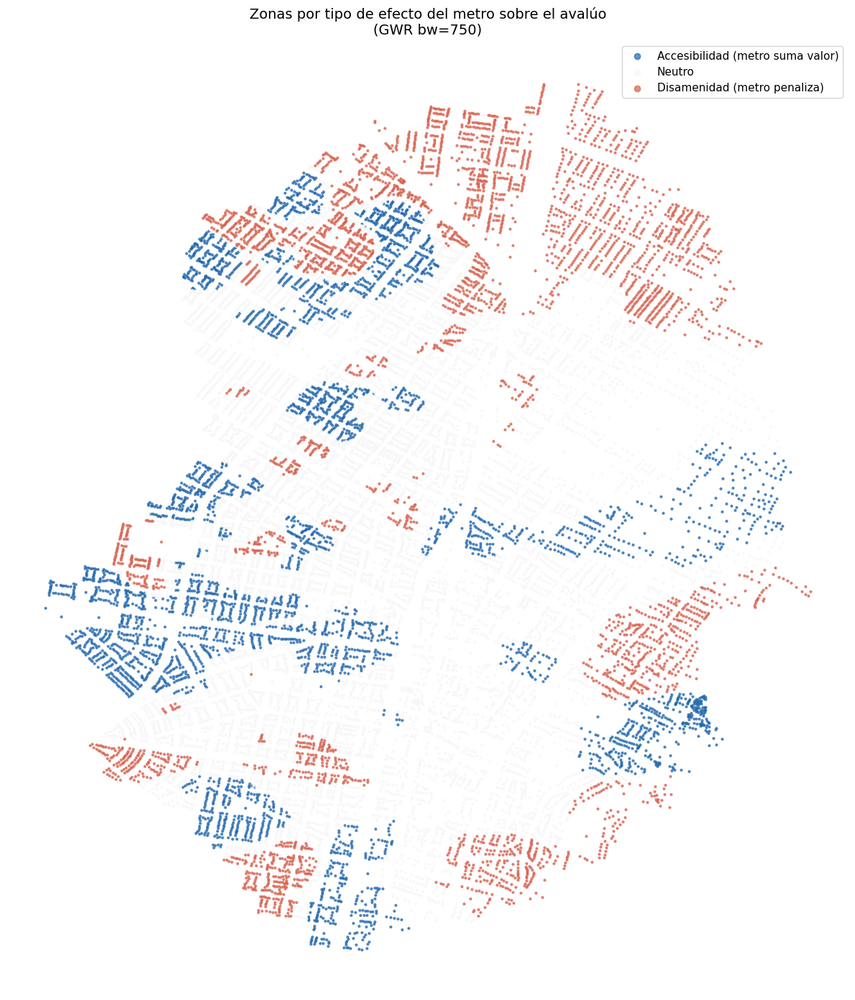

In [ ]:
# ── 31. MAPA DE ZONAS ─────────────────────────────────────────────────────
color_map = {
    'Accesibilidad (metro suma valor)': '#2166ac',
    'Neutro'                          : '#f7f7f7',
    'Disamenidad (metro penaliza)'    : '#d6604d',
}

fig, ax = plt.subplots(figsize=(12, 14))
for zona, color in color_map.items():
    mask_zona = df_modelo_mask['zona_efecto_metro'] == zona
    ax.scatter(coords_df['cx'].values[mask_zona], coords_df['cy'].values[mask_zona],
               c=color, s=4, alpha=0.7, label=zona)
ax.legend(fontsize=11, loc='upper right', markerscale=3)
ax.set_title('Zonas por tipo de efecto del metro sobre el avalúo\n(GWR bw=750)', fontsize=14)
ax.set_axis_off()
plt.tight_layout()
plt.show()

Para cada estación (Calle 63-15 y Calle 72-16), reporta el coeficiente promedio del metro, el porcentaje de lotes en cada zona de efecto y el estrato promedio — primer corte de si el patrón accesibilidad/disamenidad varía por estación.


In [ ]:
# ── 32. ANÁLISIS POR ESTACIÓN Y ESTRATO ──────────────────────────────────
print('=== COMPARACIÓN POR ESTACIÓN ===\n')
for est in df_modelo_mask['estacion'].unique():
    sub = df_modelo_mask[df_modelo_mask['estacion'] == est]
    print(f'── {est} ({len(sub):,} predios) ──')
    print(f'  Coef. metro promedio : {sub["coef_metro_local"].mean():.4f}')
    print(f'  % Accesibilidad      : {(sub["coef_metro_local"] < p25).mean()*100:.1f}%')
    print(f'  % Neutro             : {((sub["coef_metro_local"] >= p25) & (sub["coef_metro_local"] <= p75)).mean()*100:.1f}%')
    print(f'  % Disamenidad        : {(sub["coef_metro_local"] > p75).mean()*100:.1f}%')
    print(f'  Estrato promedio     : {sub["PreEstrato"].mean():.2f}')
    print()


=== COMPARACIÓN POR ESTACIÓN ===

── Calle 63-15 (8,472 predios) ──
  Coef. metro promedio : -0.0983
  % Accesibilidad      : 28.2%
  % Neutro             : 53.0%
  % Disamenidad        : 18.8%
  Estrato promedio     : 1.74

── Calle 72-16 (8,127 predios) ──
  Coef. metro promedio : 0.1592
  % Accesibilidad      : 21.7%
  % Neutro             : 46.9%
  % Disamenidad        : 31.5%
  Estrato promedio     : 1.11



**Cruce de los coeficientes locales del GWR por estación y estrato socioeconómico.** El objetivo es ver si el efecto del metro (accesibilidad vs disamenidad) varía sistemáticamente según el nivel socioeconómico del predio, no solo por su ubicación geográfica. `pct_accesib`/`pct_disamen` usan los percentiles 25/75 de la distribución global de `coef_metro_local` como umbral, para clasificar cada celda estación×estrato relativo a la distribución completa, no a un corte arbitrario. La síntesis impresa al final usa deliberadamente lenguaje correlacional ("asociado a", no "causa") porque es un corte transversal con obra activa en el corredor — el comentario en el código lo aclara para no sobre-interpretar el hallazgo como un efecto causal permanente.

In [ ]:
# ── 33. ANÁLISIS POR ESTRATO ──────────────────────────────────────────────
df_modelo_mask['estrato_int'] = df_modelo_mask['PreEstrato'].round().astype(int)

resumen = (
    df_modelo_mask
    .groupby(['estacion', 'estrato_int'])
    .agg(
        n             = ('coef_metro_local', 'count'),
        coef_promedio = ('coef_metro_local', 'mean'),
        coef_mediana  = ('coef_metro_local', 'median'),
        pct_accesib   = ('coef_metro_local', lambda x: (x < p25).mean() * 100),
        pct_disamen   = ('coef_metro_local', lambda x: (x > p75).mean() * 100),
        avaluo_prom   = (TARGET, 'mean'),
        pct_ph        = ('ph_bin', 'mean')
    ).round(3)
)
display(resumen)

# Síntesis (lenguaje correlacional -- esto es un corte del presente, con obra
# activa; no implica que el metro "penalice" el valor de forma permanente)
print('=' * 65)
print('SÍNTESIS: COEFICIENTE LOCAL DEL METRO POR ESTACIÓN Y ESTRATO')
print('=' * 65)
for est in ['Calle 63-15', 'Calle 72-16']:
    print(f'\n── {est}')
    sub = resumen.loc[est]
    for e, row in sub.iterrows():
        if row['n'] < 20: continue
        lectura = ('asociado a mayor valor' if row['coef_promedio'] < -0.05
                  else 'asociado a menor valor' if row['coef_promedio'] > 0.05 else 'neutro')
        print(f'  Estrato {e} (n={int(row["n"]):>4,}): {lectura:>22} | coef={row["coef_promedio"]:>7.3f} | avalúo prom={row["avaluo_prom"]:.2f}')


n  coef_promedio  coef_mediana  pct_accesib  \
estacion    estrato_int                                                   
Calle 63-15 0            4384         -0.085        -0.056       27.669   
            2             112         -1.432        -1.583       99.107   
            3            1534         -0.053        -0.053       24.446   
            4            2350         -0.114        -0.024       29.362   
            5              52          0.483         0.536        0.000   
            6              40          0.589         0.573        0.000   
Calle 72-16 0            5561          0.121        -0.001       21.956   
            3            1748          0.019        -0.027       24.371   
            4             453          0.791         0.710        7.947   
            5             249          0.992         0.323        4.819   
            6             116         -0.170        -0.209       56.897   

                         pct_disamen  avaluo_prom  pct_ph  
estacion    estrato_int                                    
Calle 63-15 0                 17.290       20.748   0.553  
            2                  0.000       19.149   1.000  
            3                 16.493       19.740   0.986  
            4                 21.277       20.087   0.968  
            5                 96.154       19.823   0.981  
            6                 80.000       19.721   1.000  
Calle 72-16 0                 29.203       20.804   0.487  
            3                 24.657       19.846   0.982  
            4                 76.821       20.321   0.854  
            5                 61.044       20.066   0.988  
            6                  1.724       19.840   0.983

SÍNTESIS: COEFICIENTE LOCAL DEL METRO POR ESTACIÓN Y ESTRATO

── Calle 63-15
  Estrato 0 (n=4,384): asociado a mayor valor | coef= -0.085 | avalúo prom=20.75
  Estrato 2 (n= 112): asociado a mayor valor | coef= -1.432 | avalúo prom=19.15
  Estrato 3 (n=1,534): asociado a mayor valor | coef= -0.053 | avalúo prom=19.74
  Estrato 4 (n=2,350): asociado a mayor valor | coef= -0.114 | avalúo prom=20.09
  Estrato 5 (n=  52): asociado a menor valor | coef=  0.483 | avalúo prom=19.82
  Estrato 6 (n=  40): asociado a menor valor | coef=  0.589 | avalúo prom=19.72

── Calle 72-16
  Estrato 0 (n=5,561): asociado a menor valor | coef=  0.121 | avalúo prom=20.80
  Estrato 3 (n=1,748):                 neutro | coef=  0.019 | avalúo prom=19.85
  Estrato 4 (n= 453): asociado a menor valor | coef=  0.791 | avalúo prom=20.32
  Estrato 5 (n= 249): asociado a menor valor | coef=  0.992 | avalúo prom=20.07
  Estrato 6 (n= 116): asociado a mayor valor | coef= -0.170 | avalúo prom=19.84


### Diagnóstico — Estrato 2 en Calle 63-15, banda >1200m (n=112)

Coeficiente GWR muy negativo (-1.43 prom.) y no explicable por outliers,
ventana GWR estirada, colinealidad metro-viaducto, ni cercanía real al
viaducto (se descartaron una por una). Conclusión: inestabilidad de la
estimación local del GWR en un bolsón chico y homogéneo — no se reporta
como hallazgo sustantivo del efecto del metro.


In [ ]:
sub_est2 = df_modelo_mask[
    (df_modelo_mask['estacion'] == 'Calle 63-15') & (df_modelo_mask['estrato_int'] == 2)
].copy()

print(f'N lotes: {len(sub_est2)}')
print(sub_est2['coef_metro_local'].describe())

display(
    sub_est2.nsmallest(10, 'coef_metro_local')
    [['barmanpre', 'coef_metro_local', TARGET, 'log_area_terreno']]
)


N lotes: 112
count    112.000000
mean      -1.432067
std        0.608925
min       -2.174779
25%       -1.979315
50%       -1.583219
75%       -0.874802
max       -0.095444
Name: coef_metro_local, dtype: float64


,barmanpre,coef_metro_local,log_valor_avaluo,log_area_terreno
13564,008211032007,-2.174779,19.831212,4.707727
13563,008211032006,-2.168146,19.356613,4.237001
13562,008211032005,-2.167726,19.741361,4.810557
13561,008211032004,-2.163941,19.959788,4.755313
12782,008205009028,-2.128147,20.449859,5.210032
13568,008211034002,-2.112872,19.206010,4.632785
12778,008205009023,-2.109646,20.948149,5.680173
12779,008205009025,-2.096945,20.063337,4.360548
13570,008211034004,-2.095284,18.496456,3.981549
12769,008205009012,-2.092561,20.436691,5.159055


### Preparación de capas del metro para los mapas

Antes de las visualizaciones geográficas de esta sección, se cargan las capas de estaciones y trazado de la Línea 1 (para dibujarlas como referencia sobre los mapas de coeficientes), se verifica que su CRS y su rango de coordenadas sean compatibles con los de los predios, y se define la función auxiliar `add_metro_layers` que añade el trazado (línea) y las estaciones (puntos con etiqueta) a cualquier eje de `matplotlib` — evita repetir ese bloque de código en cada mapa de las celdas siguientes.


In [ ]:
# ── CARGAR CAPAS DEL METRO ────────────────────────────────────────────────
import geopandas as gpd
from shapely import wkt

# Estaciones
gdf_estaciones = gpd.read_file(
    '/content/drive/MyDrive/Catastro/BaseDatosGD.gdb',
    layer='EstacionesLinea1'
)

# Trazado
gdf_trazado = gpd.read_file(
    '/content/drive/MyDrive/Catastro/BaseDatosGD.gdb',
    layer='TrazadoLinea1'
)

print(f'Estaciones CRS : {gdf_estaciones.crs}')
print(f'Trazado CRS    : {gdf_trazado.crs}')
print(f'Estaciones     : {len(gdf_estaciones)}')
display(gdf_estaciones.head())

/usr/local/lib/python3.12/dist-packages/pyogrio/raw.py:200: UserWarning: Measured (M) geometry types are not supported. Original type 'Measured 3D MultiPolygon' is converted to 'MultiPolygon Z'
  return ogr_read(


Estaciones CRS : EPSG:6247
Trazado CRS    : EPSG:6247
Estaciones     : 2


/usr/local/lib/python3.12/dist-packages/pyogrio/raw.py:200: UserWarning: Measured (M) geometry types are not supported. Original type 'Measured 3D MultiLineString' is converted to 'MultiLineString Z'
  return ogr_read(


,OBJECTID_1,RefName,NUMERO,NOMBRE,Shape_Leng,TIPO,Shape_Length,Shape_Area,geometry
0,14,Calle 63-15,15,E15,334.399964,No Definida,334.40060,2579.989951,"MULTIPOLYGON Z (((101435.102 105881.69 0, 1014..."
1,15,Calle 72-16,16,E16,343.999879,No Definida,344.00047,3300.002786,"MULTIPOLYGON Z (((101783.052 107187.499 0, 101..."


In [ ]:
# ── REPROYECTAR AL CRS DE LOS PREDIOS ─────────────────────────────────────
# Los predios están en coordenadas métricas (~100,000)
# Necesitamos identificar el CRS correcto

print(f'Rango cx predios: {coords_df["cx"].min():.0f} — {coords_df["cx"].max():.0f}')
print(f'Rango cy predios: {coords_df["cy"].min():.0f} — {coords_df["cy"].max():.0f}')

# Ver bounds de las capas del metro
print(f'\nBounds estaciones: {gdf_estaciones.total_bounds}')
print(f'Bounds trazado   : {gdf_trazado.total_bounds}')

Rango cx predios: 100066 — 102974
Rango cy predios: 104451 — 108656

Bounds estaciones: [101391.8708 105734.0124 101783.0522 107191.2504]
Bounds trazado   : [101172.6689 104450.5285 101895.7243 107871.5533]


In [ ]:
# ── FUNCIÓN HELPER — AÑADIR CAPAS METRO ───────────────────────────────────
def add_metro_layers(ax, estaciones=True, trazado=True,
                     color_trazado='black', color_estacion='black',
                     lw_trazado=2, s_estacion=80, zorder=10):
    if trazado:
        gdf_trazado.plot(ax=ax, color=color_trazado, linewidth=lw_trazado,
                         zorder=zorder, label='Trazado L1')
    if estaciones:
        centroides = gdf_estaciones.geometry.centroid
        ax.scatter(centroides.x, centroides.y,
                   color=color_estacion, s=s_estacion, zorder=zorder+1,
                   marker='o', edgecolors='white', linewidth=1.5,
                   label='Estaciones')
        # Etiquetas
        for _, row in gdf_estaciones.iterrows():
            cx_e = row.geometry.centroid.x
            cy_e = row.geometry.centroid.y
            ax.annotate(row['RefName'], (cx_e, cy_e),
                        textcoords='offset points', xytext=(8, 5),
                        fontsize=8, color='black', fontweight='bold')

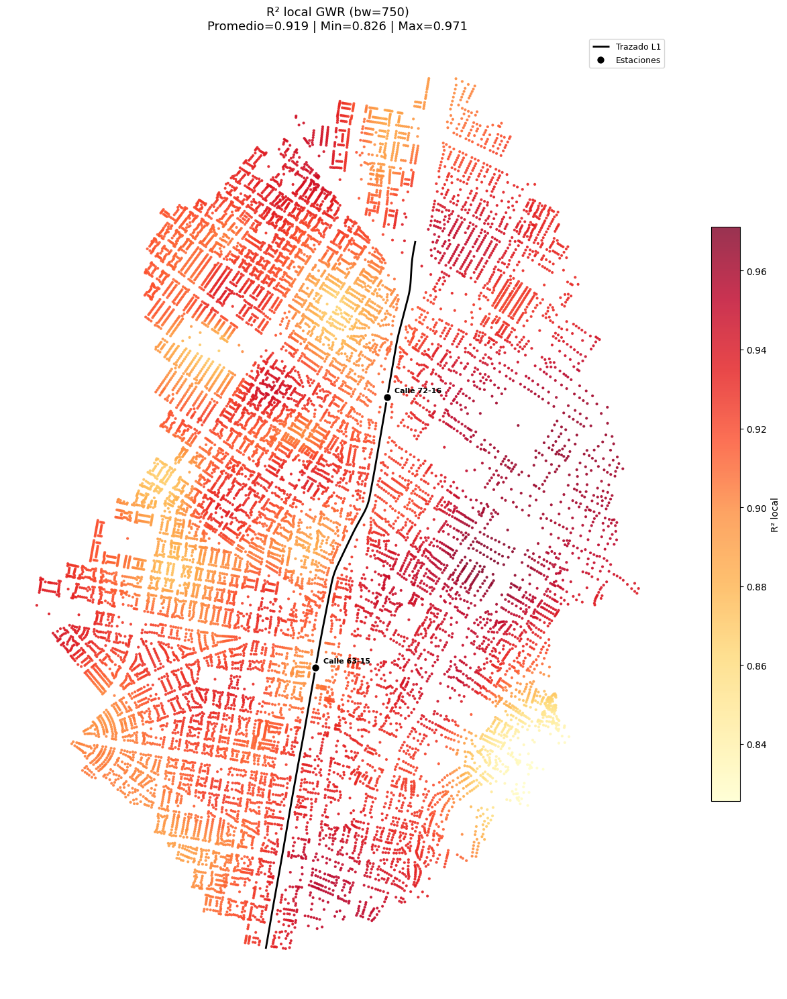

In [ ]:
# ── GWR VIZ 1: MAPA R² LOCAL CON CAPAS METRO ─────────────────────────────
fig, ax = plt.subplots(figsize=(13, 15))

r2_local = gwr_results.localR2
sc = ax.scatter(cx_arr, cy_arr, c=r2_local, cmap='YlOrRd',
                vmin=r2_local.min(), vmax=r2_local.max(), s=4, alpha=0.8)
plt.colorbar(sc, ax=ax, label='R² local', shrink=0.6)
add_metro_layers(ax)
ax.legend(loc='upper right', fontsize=9)
ax.set_title(
    f'R² local GWR (bw=750)\n'
    f'Promedio={r2_local.mean():.3f} | Min={r2_local.min():.3f} | Max={r2_local.max():.3f}',
    fontsize=13
)
ax.set_axis_off()
plt.tight_layout()
plt.show()

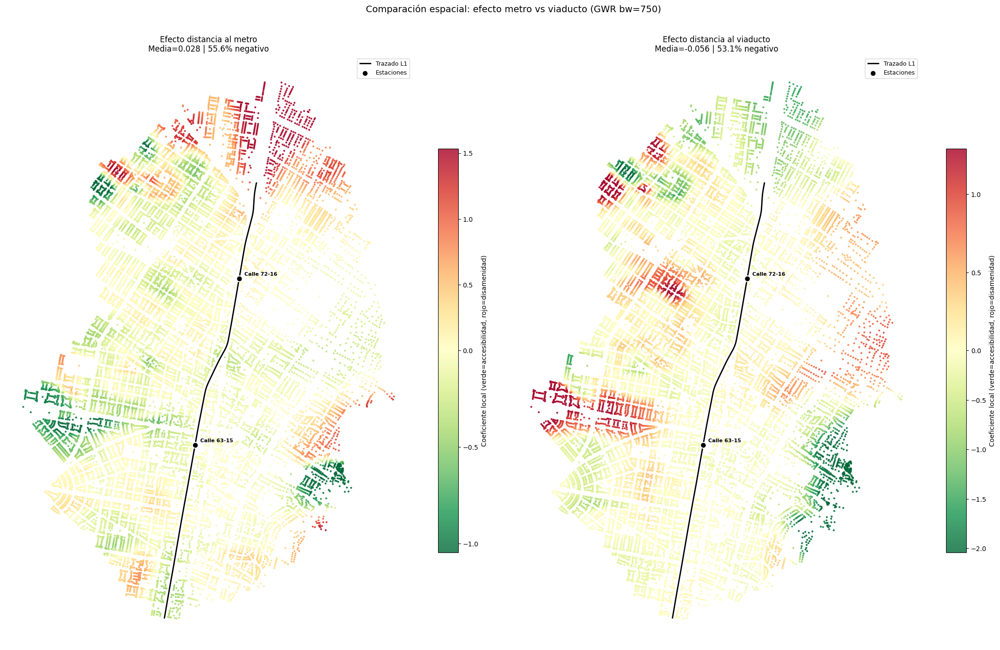

In [ ]:
# ── GWR VIZ 2: METRO VS VIADUCTO SIDE-BY-SIDE CON CAPAS ──────────────────
fig, axes = plt.subplots(1, 2, figsize=(22, 15))

for ax, var, titulo in zip(
    axes,
    ['log_dist_estacion_metro_m', 'log_dist_viaducto_m'],
    ['Efecto distancia al metro', 'Efecto distancia al viaducto']
):
    coefs = coef_df[var].values
    vmin  = np.percentile(coefs, 2)
    vmax  = np.percentile(coefs, 98)
    norm  = TwoSlopeNorm(vmin=vmin, vcenter=0, vmax=vmax) if vmin < 0 < vmax else None

    sc = ax.scatter(cx_arr, cy_arr, c=np.clip(coefs, vmin, vmax),
                    cmap='RdYlGn_r', norm=norm, s=4, alpha=0.8)
    plt.colorbar(sc, ax=ax, label='Coeficiente local (verde=accesibilidad, rojo=disamenidad)', shrink=0.6)
    add_metro_layers(ax)

    media   = coefs.mean()
    pct_neg = (coefs < 0).mean() * 100
    ax.set_title(f'{titulo}\nMedia={media:.3f} | {pct_neg:.1f}% negativo', fontsize=12)
    ax.legend(loc='upper right', fontsize=9)
    ax.set_axis_off()

plt.suptitle('Comparación espacial: efecto metro vs viaducto (GWR bw=750)', fontsize=14)
plt.tight_layout()
plt.show()

**Visualización comparativa: coeficiente local de metro vs viaducto.** Dos scatter geográficos lado a lado, coloreados por el coeficiente GWR de cada predio (rojo-amarillo-verde divergente, centrado en 0 con `TwoSlopeNorm`). El clip a percentiles 2-98 evita que un puñado de outliers extremos comprima la escala de color y opaque el patrón espacial dominante. Esta gráfica es la evidencia visual central de la heterogeneidad espacial: permite comparar en un mismo layout si la zona de metro y la zona de viaducto muestran signos opuestos (accesibilidad vs disamenidad), que es el hallazgo central del proyecto.

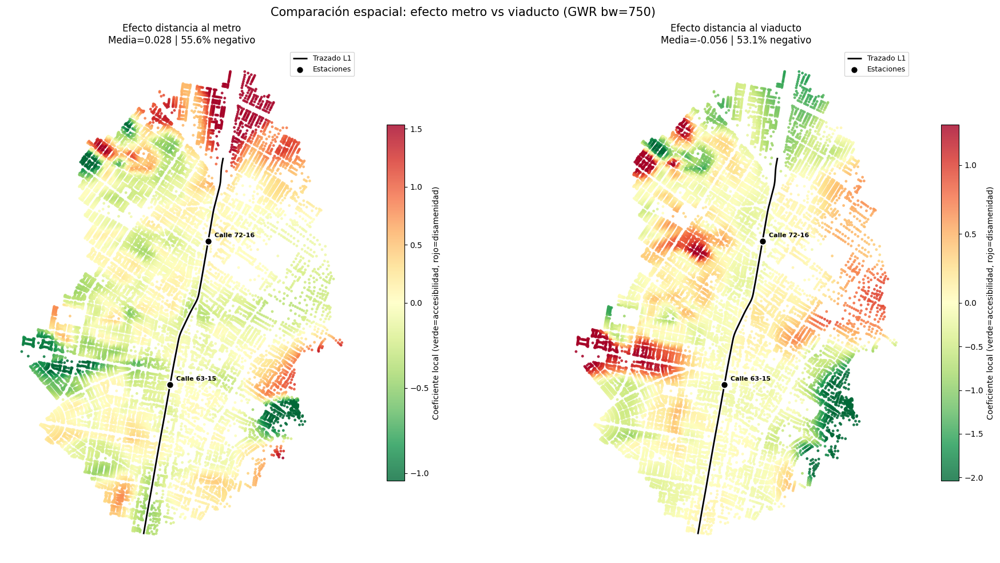

In [ ]:
# ── GWR VIZ 6: COMPARACIÓN METRO VS VIADUCTO (2 GRÁFICAS CONTINUAS) ────────────────────────
fig, axes = plt.subplots(1, 2, figsize=(20, 10))

# ──────────────────────────────────────────────────────────────────────
# 1. GRÁFICA IZQUIERDA: EFECTO DISTANCIA AL METRO
# ──────────────────────────────────────────────────────────────────────
coefs_metro = coef_df['log_dist_estacion_metro_m'].values
vmin_m = np.percentile(coefs_metro, 2)
vmax_m = np.percentile(coefs_metro, 98)
norm_m = TwoSlopeNorm(vmin=vmin_m, vcenter=0, vmax=vmax_m)

sc1 = axes[0].scatter(
    cx_arr, cy_arr, # Mapa completo sin máscaras
    c=np.clip(coefs_metro, vmin_m, vmax_m),
    cmap='RdYlGn_r', norm=norm_m, s=6, alpha=0.8
)
plt.colorbar(sc1, ax=axes[0], shrink=0.7, label='Coeficiente local (verde=accesibilidad, rojo=disamenidad)')
add_metro_layers(axes[0])

# Cálculo de métricas para el título idéntico al original
media_m = np.mean(coefs_metro)
neg_m = (coefs_metro < 0).sum() / len(coefs_metro) * 100
axes[0].set_title(f'Efecto distancia al metro\nMedia={media_m:.3f} | {neg_m:.1f}% negativo', fontsize=12)
axes[0].legend(loc='upper right', fontsize=9)
axes[0].set_axis_off()


# ──────────────────────────────────────────────────────────────────────
# 2. GRÁFICA DERECHA: EFECTO DISTANCIA AL VIADUCTO
# ──────────────────────────────────────────────────────────────────────
coefs_viad = coef_df['log_dist_viaducto_m'].values
vmin_v = np.percentile(coefs_viad, 2)
vmax_v = np.percentile(coefs_viad, 98)
norm_v = TwoSlopeNorm(vmin=vmin_v, vcenter=0, vmax=vmax_v)

sc2 = axes[1].scatter(
    cx_arr, cy_arr, # Mapa completo sin máscaras
    c=np.clip(coefs_viad, vmin_v, vmax_v),
    cmap='RdYlGn_r', norm=norm_v, s=6, alpha=0.8
)
plt.colorbar(sc2, ax=axes[1], shrink=0.7, label='Coeficiente local (verde=accesibilidad, rojo=disamenidad)')
add_metro_layers(axes[1])

# Cálculo de métricas para el viaducto
media_v = np.mean(coefs_viad)
neg_v = (coefs_viad < 0).sum() / len(coefs_viad) * 100
axes[1].set_title(f'Efecto distancia al viaducto\nMedia={media_v:.3f} | {neg_v:.1f}% negativo', fontsize=12)
axes[1].legend(loc='upper right', fontsize=9)
axes[1].set_axis_off()


# ──────────────────────────────────────────────────────────────────────
# CONFIGURACIÓN FINAL DEL LIENZO
# ──────────────────────────────────────────────────────────────────────
plt.suptitle('Comparación espacial: efecto metro vs viaducto (GWR bw=750)', fontsize=15, y=0.98)
plt.tight_layout()
plt.show()

## 12. XGBoost + SHAP — Validación no paramétrica

### Validación cruzada y ajuste del modelo XGBoost

Corre validación cruzada 5-fold sobre XGBoost (hiperparámetros fijos: 500 árboles, profundidad 6, subsample/colsample 0.8) usando el mismo set de features que los modelos espaciales, para tener un punto de comparación no paramétrico frente al SAR (el RMSE del SAR se toma directamente de `resultados_moran`, ya calculado antes, para que la comparación nunca quede desactualizada si se vuelve a correr el notebook). La celda siguiente ajusta el modelo final sobre todo el set de entrenamiento y reporta sus métricas.


In [ ]:
# ── 34. VALIDACIÓN CRUZADA 5-FOLD ────────────────────────────────────────
X_xgb = df_modelo.loc[mask, FEATURES_FINAL].copy()
y_xgb = df_modelo.loc[mask, TARGET].copy()

assert hasattr(y_xgb, '__len__') and len(y_xgb) > 1, f"y_xgb no es un vector: {y_xgb!r}"
print(f'X_xgb: {X_xgb.shape} | y_xgb: {y_xgb.shape}')

modelo_xgb = xgb.XGBRegressor(
    n_estimators=500, learning_rate=0.05, max_depth=6,
    subsample=0.8, colsample_bytree=0.8, random_state=42,
    n_jobs=-1, tree_method='hist', verbosity=0
)

kf      = KFold(n_splits=5, shuffle=True, random_state=42)
cv_rmse = np.sqrt(-cross_val_score(modelo_xgb, X_xgb, y_xgb, cv=kf,
                                   scoring='neg_mean_squared_error', n_jobs=-1))
cv_r2   = cross_val_score(modelo_xgb, X_xgb, y_xgb, cv=kf, scoring='r2', n_jobs=-1)

print(f'Validación cruzada 5-fold:')
print(f'  RMSE  : {cv_rmse.mean():.4f} ± {cv_rmse.std():.4f}')
print(f'  R²    : {cv_r2.mean():.4f} ± {cv_r2.std():.4f}')

# RMSE del SAR tomado de resultados_moran (celda 23), no hardcodeado —
# asi nunca queda desactualizado si vuelves a correr los modelos.
rmse_sar = resultados_moran['SAR']['RMSE']
print(f'\nComparación:')
print(f'  RMSE SAR : {rmse_sar:.4f}')
print(f'  RMSE XGB : {cv_rmse.mean():.4f} (mejora del {(1 - cv_rmse.mean()/rmse_sar)*100:.1f}%)')

X_xgb: (16599, 20) | y_xgb: (16599,)
Validación cruzada 5-fold:
  RMSE  : 0.2095 ± 0.0076
  R²    : 0.9642 ± 0.0027

Comparación:
  RMSE SAR : 0.3561
  RMSE XGB : 0.2095 (mejora del 41.2%)


In [ ]:
# ── 35. ENTRENAR MODELO FINAL ─────────────────────────────────────────────
modelo_xgb.fit(X_xgb, y_xgb)
y_pred     = modelo_xgb.predict(X_xgb)
r2_train   = r2_score(y_xgb, y_pred)
rmse_train = np.sqrt(mean_squared_error(y_xgb, y_pred))
print(f'Métricas entrenamiento: R²={r2_train:.4f} | RMSE={rmse_train:.4f}')

Métricas entrenamiento: R²=0.9874 | RMSE=0.1245


Define `reconstruir_categorica`, función auxiliar que revierte el one-hot encoding: dado un prefijo de columnas dummy (p. ej. `iso_`), reconstruye la columna categórica original, asignando `'BASE'` a las filas donde ninguna dummy está activa (la categoría de referencia que `drop_first` eliminó). Se usa varias veces más adelante para poder graficar y tabular por destino/uso/banda de isócrona en su forma categórica legible, en vez de trabajar con las dummies sueltas.


In [ ]:
import numpy as np
import pandas as pd

def reconstruir_categorica(df_in, prefijo):
    cols = [c for c in df_in.columns if c.startswith(prefijo)]
    if not cols:
        return pd.Series(np.nan, index=df_in.index)
    base = df_in[cols].sum(axis=1) == 0
    lab  = pd.Series(np.where(base, 'BASE', pd.NA), index=df_in.index, dtype=object)
    for c in cols:
        lab = np.where(df_in[c] == 1, c[len(prefijo):], lab)
    return pd.Series(lab, index=df_in.index)

df['banda_iso_m'] = reconstruir_categorica(df, 'iso_')
print(df['banda_iso_m'].value_counts(dropna=False))

banda_iso_m
800-1200    6431
400-800     4634
>1200       4083
BASE        1465
Name: count, dtype: int64


Reconstruye el conteo de lotes por categoría de destino a partir de las dummies `dest_`, incluyendo la categoría base (Residencial, la eliminada por `drop_first`) como la diferencia entre el total y la suma de las dummies activas.


In [ ]:
# Conteo por categoria de destino, reconstruido desde las dummies dest_*
dest_cols = [c for c in df_modelo.columns if c.startswith('dest_')]
conteo_dest = df_modelo[dest_cols].sum().sort_values(ascending=False)
conteo_dest['BASE (categoria dropeada por drop_first)'] = len(df_modelo) - df_modelo[dest_cols].sum(axis=1).sum()
print(conteo_dest)

dest_Comercio Corredor Comercial            6138
dest_Comercio Puntual                       2356
dest_Dotacional Privado                      549
dest_Parqueaderos                            155
dest_Otros                                   151
dest_Urbanizado No Edificado                 145
dest_Dotacional Público                       88
dest_Comercio Centro Comercial                36
BASE (categoria dropeada por drop_first)    6995
dtype: int64


In [ ]:
print((conteo_dest / len(df_modelo) * 100).round(1))
print(modelo_sar.summary)

dest_Comercio Corredor Comercial            36.9
dest_Comercio Puntual                       14.2
dest_Dotacional Privado                      3.3
dest_Parqueaderos                            0.9
dest_Otros                                   0.9
dest_Urbanizado No Edificado                 0.9
dest_Dotacional Público                      0.5
dest_Comercio Centro Comercial               0.2
BASE (categoria dropeada por drop_first)    42.1
dtype: float64
REGRESSION RESULTS
------------------

SUMMARY OF OUTPUT: SPATIAL TWO STAGE LEAST SQUARES
------------------------------------------------------------------------------------
Data set            :     unknown
Weights matrix      :     unknown
Dependent Variable  :log_valor_avaluo                Number of Observations:       16599
Mean dependent var  :     20.4405                Number of Variables   :          22
S.D. dependent var  :      1.1090                Degrees of Freedom    :       16577
Pseudo R-squared    :      0.8969
Spatial 

### Prueba de robustez: área de terreno por chip vs. área total del lote

`area_terreno_2026` a nivel lote es el área **total** del predio, que para lotes con muchos chips (edificios PH grandes) puede sobrestimar el "tamaño" real de la unidad de análisis. Aquí se prueba una especificación alternativa dividiendo el área de terreno entre `n_chips_por_lote` (área de terreno *por chip*) y se recalcula el OLS para ver si el coeficiente de área y el Moran I de los residuales cambian de forma relevante frente a la especificación original — es un chequeo de robustez, no reemplaza la especificación final del modelo.


In [ ]:
import statsmodels.api as sm
from esda.moran import Moran
df_modelo['area_terreno_por_chip']     = df_modelo['area_terreno_2026'] / df_modelo['n_chips_por_lote']
df_modelo['log_area_terreno_por_chip'] = log_seguro(df_modelo['area_terreno_por_chip'])

FEATURES_TEST = [f if f != 'log_area_terreno' else 'log_area_terreno_por_chip'
                  for f in FEATURES_FINAL]

X_test = df_modelo.loc[mask, FEATURES_TEST].copy()
y_test = df_modelo.loc[mask, TARGET].copy()

X_test_sm = sm.add_constant(X_test)
ols_test  = sm.OLS(y_test, X_test_sm).fit()

moran_test = Moran(ols_test.resid.values, W_final)

print('=== Con area_terreno_por_chip ===')
print(f'R2                   : {ols_test.rsquared:.4f}')
print(f'Coef area_terreno    : {ols_test.params["log_area_terreno_por_chip"]:.4f}')
print(f'Coef area_construida : {ols_test.params["log_area_construida_sum"]:.4f}')
print(f'Moran I residuales   : {moran_test.I:.4f}  (p={moran_test.p_sim:.4f})')

print('\n=== Original (area_terreno total del lote) — para comparar ===')
print(f'R2                : {modelo_ols.rsquared:.4f}')
print(f'Coef area_terreno : {modelo_ols.params["log_area_terreno"]:.4f}')
print(f'Moran I residuales: {moran_ols.I:.4f}')   # de la celda 18, no hardcodeado

Chequeo exploratorio previo al diagnóstico formal de la celda siguiente: describe qué tan extremo es el problema de "super predio" (lotes con muchísimos chips agregados) y su leverage en el OLS. Esta celda queda como borrador/exploración; el chequeo definitivo con la comparación de Moran I con/sin outliers está en la celda de abajo.


In [ ]:
# 1. Que tan extremo es el problema de "super predio" — distribucion de n_chips_por_lote
print(df_modelo['n_chips_por_lote'].describe())
print('\nTop 20 lotes con mas chips:')
print(df_modelo.nlargest(20, 'n_chips_por_lote')[['barmanpre','n_chips_por_lote','area_construida_2026','valor_avaluo_2026']])
from statsmodels.stats.outliers_influence import OLSInfluence
infl = OLSInfluence(modelo_ols)  # el OLS de la version SUM+SUM
leverage = infl.hat_matrix_diag
df_modelo['leverage'] = np.nan
df_modelo.loc[mask, 'leverage'] = leverage

print('\nCorrelacion entre leverage y n_chips_por_lote (SUM+SUM):')
print(df_modelo[['leverage','n_chips_por_lote']].corr())

p99 = df_modelo['n_chips_por_lote'].quantile(0.99)
mask_sin_extremos = mask & (df_modelo['n_chips_por_lote'] <= p99)
print(f'\nLotes excluidos (top 1% por n_chips): {(mask & ~mask_sin_extremos).sum()}')

count    16613.000000
mean         6.204659
std         27.861543
min          1.000000
25%          1.000000
50%          1.000000
75%          1.000000
max       1300.000000
Name: n_chips_por_lote, dtype: float64

Top 20 lotes con mas chips:
          barmanpre  n_chips_por_lote  area_construida_2026  valor_avaluo_2026
12825  008205010008              1300                 10.80       2.519400e+07
13882  008213009038               781                 12.50       1.907200e+07
12057  008202001007               727                 12.20       3.741000e+07
12857  008205063001               727                 27.40       1.814910e+08
14862  008214025025               597                 10.67       3.741000e+07
13883  008213009039               580                  1.22       1.952000e+06
16295  008313018014               560                 98.30       6.386800e+08
3720   007302025010               554                 34.48       2.829290e+08
2486   007204005037               506        

**Diagnóstico: ¿el Moran I alto del OLS/SAR está sostenido por outliers de agregación, o es un problema espacial de fondo?** `n_chips_por_lote` es el número de unidades (chips) de propiedad horizontal agregadas en un mismo lote; lotes con valores extremos (torres muy grandes) pueden tener leverage desproporcionado en la regresión. Se corre `OLSInfluence` para el leverage, se excluye el top 1% por `n_chips_por_lote`, y se recalcula OLS + Moran I sobre los residuales de ese subconjunto. Si el Moran I baja poco al excluir los extremos, la autocorrelación espacial es estructural (justifica los modelos SEM/SAR/SARAR) y no un artefacto de unos pocos lotes atípicos.

In [ ]:
# ── CHEQUEO: LEVERAGE vs N_CHIPS_POR_LOTE ──────────────────────────────────
# Determina si el Moran alto del OLS/SAR esta sostenido por un puñado de
# lotes atipicos (n_chips_por_lote extremo) o si es un problema mas de fondo.
from statsmodels.stats.outliers_influence import OLSInfluence

infl = OLSInfluence(modelo_ols)
leverage = infl.hat_matrix_diag
df_modelo['leverage'] = np.nan
df_modelo.loc[mask, 'leverage'] = leverage

print('Correlacion entre leverage y n_chips_por_lote:')
print(df_modelo[['leverage','n_chips_por_lote']].corr())

p99 = df_modelo['n_chips_por_lote'].quantile(0.99)
mask_sin_extremos = mask & (df_modelo['n_chips_por_lote'] <= p99)
print(f'\nLotes excluidos (top 1% por n_chips, p99={p99:.0f}): {(mask & ~mask_sin_extremos).sum()}')

X_sin_extremos = df_modelo.loc[mask_sin_extremos, FEATURES_FINAL].copy()
y_sin_extremos = df_modelo.loc[mask_sin_extremos, TARGET].copy()
X_sin_extremos_sm = sm.add_constant(X_sin_extremos)
ols_sin_extremos = sm.OLS(y_sin_extremos, X_sin_extremos_sm).fit()

coords_sin_extremos = df_modelo.loc[mask_sin_extremos, ['cx','cy']].reset_index(drop=True)
with warnings.catch_warnings():
    warnings.simplefilter('ignore')
    w_sin_extremos = KNN.from_array(coords_sin_extremos.values, k=10)
    w_sin_extremos.transform = 'r'

moran_sin_extremos = Moran(ols_sin_extremos.resid.values, w_sin_extremos)

print(f'\n=== Comparacion ===')
print(f'Moran I (con todos los lotes)      : {resultados_moran["OLS"]["I"]:.4f}')
print(f'Moran I (excluyendo top 1% n_chips): {moran_sin_extremos.I:.4f}')
print(f'R2 (con todos)   : {modelo_ols.rsquared:.4f}')
print(f'R2 (sin extremos): {ols_sin_extremos.rsquared:.4f}')


Correlacion entre leverage y n_chips_por_lote:
                  leverage  n_chips_por_lote
leverage          1.000000          0.168311
n_chips_por_lote  0.168311          1.000000

Lotes excluidos (top 1% por n_chips, p99=99): 166

=== Comparacion ===
Moran I (con todos los lotes)      : 0.4289
Moran I (excluyendo top 1% n_chips): 0.4214
R2 (con todos)   : 0.8836
R2 (sin extremos): 0.8790


### Reconstrucción de categorías legibles y renombrado de bandas

Reconstruye, usando `reconstruir_categorica`, las versiones categóricas de destino (`destino_cat`), uso (`uso_cat`) y banda de isócrona (`banda_iso_m`) sobre `df_modelo_mask`, y verifica contra la distancia mediana a la estación cuál banda corresponde en realidad a la categoría base `'BASE'` (la más cercana, ya que es la que `drop_first` elimina). Con esa verificación, las dos celdas siguientes renombran `'BASE'` a su etiqueta real: `'Residencial'` para destino y `'0-400'` para la banda de isócrona más cercana a la estación.


In [ ]:

df_modelo_mask['destino_cat'] = reconstruir_categorica(df_modelo_mask, 'dest_')
df_modelo_mask['uso_cat']     = reconstruir_categorica(df_modelo_mask, 'uso_')


df_modelo_mask['banda_iso_m'] = reconstruir_categorica(df_modelo_mask, 'iso_')

dist_col = 'log_dist_estacion_metro_m' if 'log_dist_estacion_metro_m' in df_modelo_mask.columns else None
if dist_col:
    print('Distancia mediana a la estacion, por banda (para identificar BASE):')
    print(df_modelo_mask.groupby('banda_iso_m')[dist_col].median().sort_values())
else:
    print('No se encontro columna de distancia en df_modelo_mask para verificar BASE; revisar manualmente.')

print()
print('Destino:')
print(df_modelo_mask['destino_cat'].value_counts(dropna=False))
print()
print('Uso:')
print(df_modelo_mask['uso_cat'].value_counts(dropna=False))
print()
print('Banda de isocrona (antes de renombrar BASE):')
print(df_modelo_mask['banda_iso_m'].value_counts(dropna=False))

Distancia mediana a la estacion, por banda (para identificar BASE):
banda_iso_m
BASE        5.814336
400-800     6.541170
800-1200    7.038626
>1200       7.309398
Name: log_dist_estacion_metro_m, dtype: float64

Destino:
destino_cat
BASE                           6995
Comercio Corredor Comercial    6138
Comercio Puntual               2355
Dotacional Privado              549
Parqueaderos                    155
Otros                           150
Urbanizado No Edificado         133
Dotacional Público               88
Comercio Centro Comercial        36
Name: count, dtype: int64

Uso:
uso_cat
Habitacional menor o igual a 3 pisos en NPH    6381
Oficinas y Consultorios en NPH                 2439
Corredor Comercial en NPH                      1683
Habitacional mayor o igual a 4 pisos en PH     1610
Depósitos de Almacenamiento en NPH              673
Bodega de Almacenamiento en NPH                 536
BASE                                            363
Habitacional mayor o igual a 4 pisos e

In [ ]:
df_modelo_mask['destino_cat'] = df_modelo_mask['destino_cat'].replace({'BASE': 'Residencial'})
print(df_modelo_mask['destino_cat'].value_counts(dropna=False))

df_modelo_mask['uso_cat'] = df_modelo_mask['uso_cat'].replace(
    {'BASE': 'Sin dato / Aulas de Clases (n=2 reales)'}
)
print(df_modelo_mask['uso_cat'].value_counts(dropna=False))


destino_cat
Residencial                    6995
Comercio Corredor Comercial    6138
Comercio Puntual               2355
Dotacional Privado              549
Parqueaderos                    155
Otros                           150
Urbanizado No Edificado         133
Dotacional Público               88
Comercio Centro Comercial        36
Name: count, dtype: int64
uso_cat
Habitacional menor o igual a 3 pisos en NPH    6381
Oficinas y Consultorios en NPH                 2439
Corredor Comercial en NPH                      1683
Habitacional mayor o igual a 4 pisos en PH     1610
Depósitos de Almacenamiento en NPH              673
Bodega de Almacenamiento en NPH                 536
Sin dato / Aulas de Clases (n=2 reales)         363
Habitacional mayor o igual a 4 pisos en NPH     357
Parqueadero Cubierto en PH                      321
Oficinas y Consultorios en PH                   274
Institucional Puntual                           212
Industria artesanal                             202
Bodega

In [ ]:

RENOMBRAR_BASE = {'BASE': '0-400'}

df_modelo_mask['banda_iso_m'] = df_modelo_mask['banda_iso_m'].replace(RENOMBRAR_BASE)
orden_bandas = ['0-400', '400-800', '800-1200', '>1200']

print('Banda de isocrona (despues de renombrar):')
print(df_modelo_mask['banda_iso_m'].value_counts(dropna=False).reindex(orden_bandas))

Banda de isocrona (despues de renombrar):
banda_iso_m
0-400       1455
400-800     4633
800-1200    6429
>1200       4082
Name: count, dtype: int64


Mapea la distribución espacial del destino predominante (`destino_cat`) y, en la celda siguiente, del uso real (`uso_cat`) — visualización directa de qué tan distinto es el patrón espacial de la clasificación catastral (destino) frente al uso observado en campo.


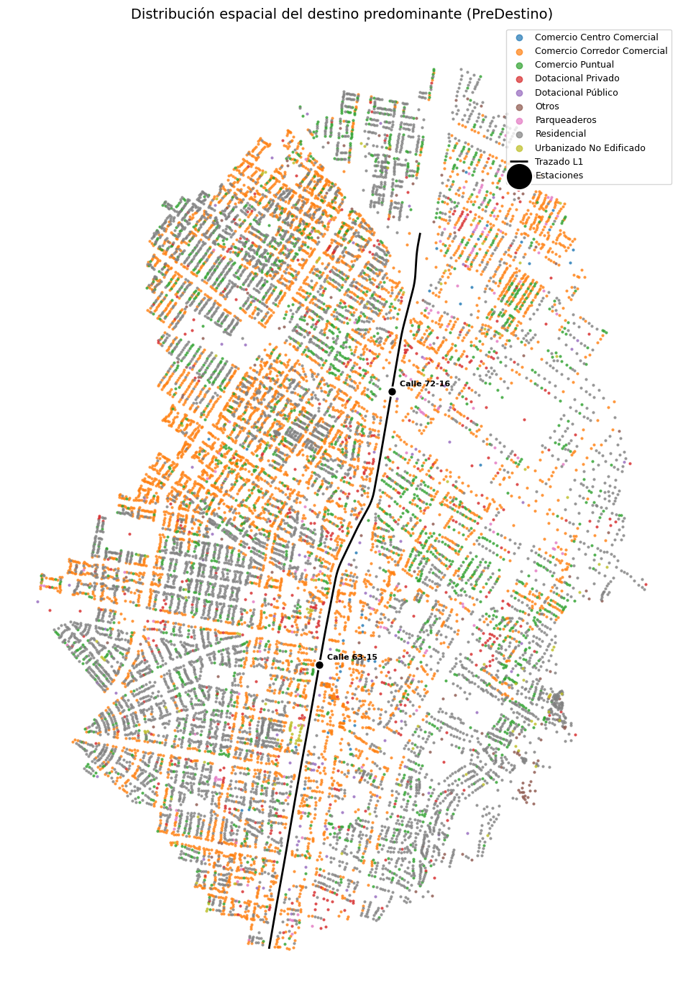

In [ ]:
# ── MAPA: DISTRIBUCIÓN ESPACIAL DE DESTINO ────────────────────────────────
categorias_destino = df_modelo_mask['destino_cat'].dropna().unique()
cmap_destino = plt.get_cmap('tab10')
color_map_destino = {cat: cmap_destino(i % 10) for i, cat in enumerate(sorted(categorias_destino))}

fig, ax = plt.subplots(figsize=(12, 14))
for cat, color in color_map_destino.items():
    m = df_modelo_mask['destino_cat'] == cat
    ax.scatter(cx_arr[m.values], cy_arr[m.values], c=[color], s=4, alpha=0.7, label=cat)
add_metro_layers(ax)
ax.legend(fontsize=9, loc='upper right', markerscale=3)
ax.set_title('Distribución espacial del destino predominante (PreDestino)', fontsize=14)
ax.set_axis_off()
plt.tight_layout()
plt.show()

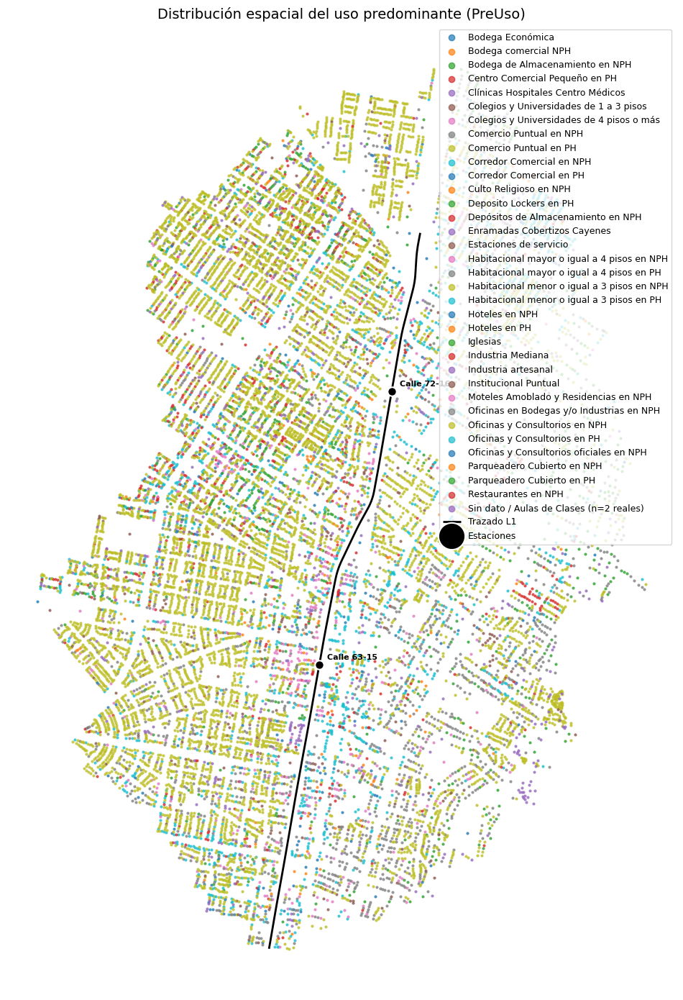

In [ ]:
# ── MAPA: DISTRIBUCIÓN ESPACIAL DE USO ────────────────────────────────────
categorias_uso = df_modelo_mask['uso_cat'].dropna().unique()
cmap_uso = plt.get_cmap('tab10')
color_map_uso = {cat: cmap_uso(i % 10) for i, cat in enumerate(sorted(categorias_uso))}

fig, ax = plt.subplots(figsize=(12, 14))
for cat, color in color_map_uso.items():
    m = df_modelo_mask['uso_cat'] == cat
    ax.scatter(cx_arr[m.values], cy_arr[m.values], c=[color], s=4, alpha=0.7, label=cat)
add_metro_layers(ax)
ax.legend(fontsize=9, loc='upper right', markerscale=3)
ax.set_title('Distribución espacial del uso predominante (PreUso)', fontsize=14)
ax.set_axis_off()
plt.tight_layout()
plt.show()

### Composición de destino y uso por banda de isócrona

Si el metro activa cambios de uso del suelo, se esperaría más participación
de destinos no-residenciales (comercio, mixto) en las bandas más cercanas
a la estación (0–400m) frente a las más lejanas (>1200m).

% de predios por categoría de destino, dentro de cada banda:


destino_cat,Comercio Centro Comercial,Comercio Corredor Comercial,Comercio Puntual,Dotacional Privado,Dotacional Público,Otros,Parqueaderos,Residencial,Urbanizado No Edificado
banda_iso_m,,,,,,,,,
0-400,1.0,55.0,10.9,6.6,1.0,0.2,1.8,21.4,2.1
400-800,0.2,36.5,15.4,3.9,0.6,0.5,0.8,41.5,0.6
800-1200,0.1,33.5,15.4,2.9,0.4,0.8,1.0,45.3,0.7
>1200,0.1,36.6,12.2,2.1,0.4,1.9,0.7,45.2,0.8


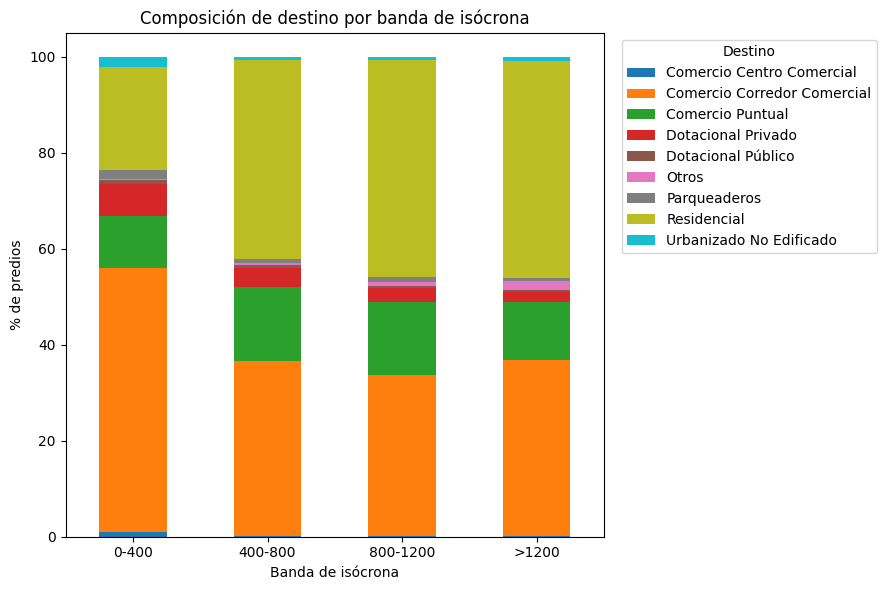

In [ ]:
tabla_destino_banda = pd.crosstab(
    df_modelo_mask['banda_iso_m'], df_modelo_mask['destino_cat'], normalize='index'
).reindex(orden_bandas) * 100

print('% de predios por categoría de destino, dentro de cada banda:')
display(tabla_destino_banda.round(1))

tabla_destino_banda.plot(kind='bar', stacked=True, figsize=(9, 6), colormap='tab10')
plt.title('Composición de destino por banda de isócrona')
plt.xlabel('Banda de isócrona')
plt.ylabel('% de predios')
plt.legend(title='Destino', bbox_to_anchor=(1.02, 1), loc='upper left')
plt.xticks(rotation=0)
plt.tight_layout()
plt.show()

% de predios por categoría de uso, dentro de cada banda:


uso_cat,Bodega Económica,Bodega comercial NPH,Bodega de Almacenamiento en NPH,Centro Comercial Pequeño en PH,Clínicas Hospitales Centro Médicos,Colegios y Universidades de 1 a 3 pisos,Colegios y Universidades de 4 pisos o más,Comercio Puntual en NPH,Comercio Puntual en PH,Corredor Comercial en NPH,...,Institucional Puntual,Moteles Amoblado y Residencias en NPH,Oficinas en Bodegas y/o Industrias en NPH,Oficinas y Consultorios en NPH,Oficinas y Consultorios en PH,Oficinas y Consultorios oficiales en NPH,Parqueadero Cubierto en NPH,Parqueadero Cubierto en PH,Restaurantes en NPH,Sin dato / Aulas de Clases (n=2 reales)
banda_iso_m,,,,,,,,,,,,,,,,,,,,,
0-400,1.5,1.0,2.6,0.5,0.1,1.9,2.1,0.5,0.0,20.1,...,1.0,3.6,0.4,14.0,3.2,0.5,1.0,0.8,0.3,4.5
400-800,0.9,0.5,2.8,0.1,0.1,1.4,0.5,0.7,0.1,10.3,...,1.6,0.6,0.5,17.9,1.9,0.2,0.5,1.3,0.6,1.4
800-1200,1.1,0.3,3.7,0.0,0.2,0.7,0.4,0.9,0.1,8.4,...,1.3,0.5,0.5,14.1,1.6,0.1,0.2,1.9,0.5,1.8
>1200,1.6,0.4,3.1,0.0,0.1,0.5,0.2,0.8,0.0,9.1,...,1.0,0.1,1.0,12.3,1.0,0.1,0.3,3.2,1.1,2.9


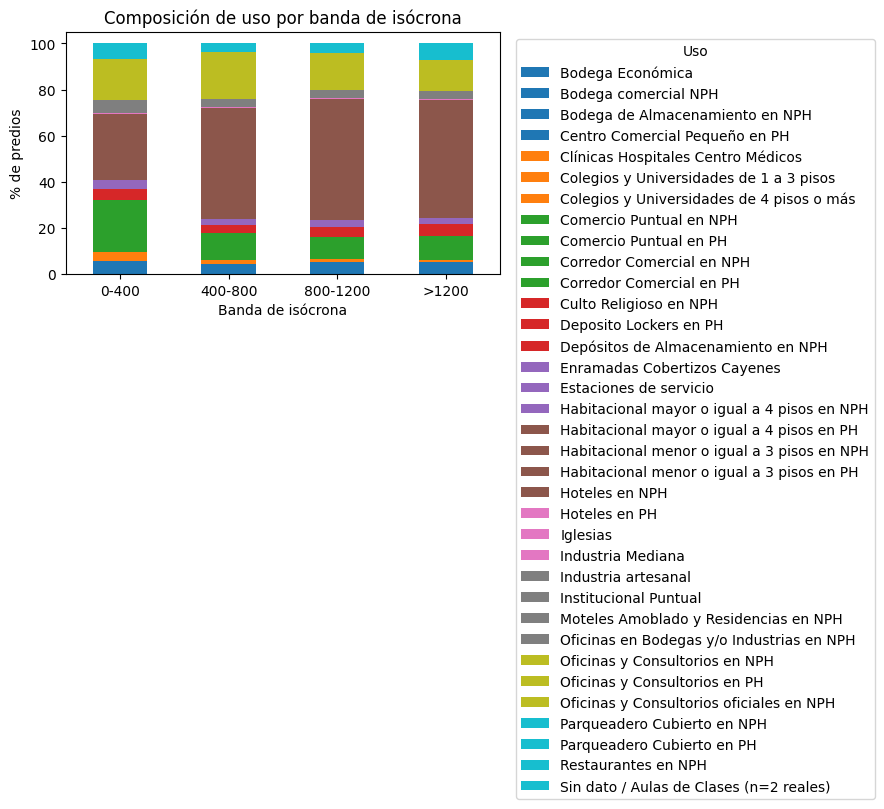

In [ ]:
tabla_uso_banda = pd.crosstab(
    df_modelo_mask['banda_iso_m'], df_modelo_mask['uso_cat'], normalize='index'
).reindex(orden_bandas) * 100

print('% de predios por categoría de uso, dentro de cada banda:')
display(tabla_uso_banda.round(1))

tabla_uso_banda.plot(kind='bar', stacked=True, figsize=(9, 6), colormap='tab10')
plt.title('Composición de uso por banda de isócrona')
plt.xlabel('Banda de isócrona')
plt.ylabel('% de predios')
plt.legend(title='Uso', bbox_to_anchor=(1.02, 1), loc='upper left')
plt.xticks(rotation=0)
plt.tight_layout()
plt.show()

Repite la tabla de composición de destino, esta vez agregada por estación en vez de por banda de isócrona, para comparar directamente Calle 63-15 vs. Calle 72-16 con el mismo criterio de la sección anterior.


In [ ]:
# Lo mismo, por estación (Calle 63-15 vs Calle 72-16) — mismo patrón de
# comparación que la Sección 11
tabla_destino_estacion = pd.crosstab(
    df_modelo_mask['estacion'], df_modelo_mask['destino_cat'], normalize='index'
) * 100

print('% de predios por categoría de destino, dentro de cada estación:')
display(tabla_destino_estacion.round(1))

% de predios por categoría de destino, dentro de cada estación:


destino_cat,Comercio Centro Comercial,Comercio Corredor Comercial,Comercio Puntual,Dotacional Privado,Dotacional Público,Otros,Parqueaderos,Residencial,Urbanizado No Edificado
estacion,,,,,,,,,
Calle 63-15,0.2,29.8,12.0,3.5,0.7,1.0,0.9,50.8,1.0
Calle 72-16,0.2,44.4,16.5,3.1,0.4,0.8,1.0,33.1,0.6


## 14. Mapas por barrio y diagnóstico estrato 0/2


### Diagnóstico de estratos extremos (0 y 2)

Examina en detalle los estratos 0 y 2, que en el contexto catastral de Bogotá suelen mezclar predios muy heterogéneos (p. ej. estrato 0 agrupa predios no residenciales o sin estrato asignado). Compara, dentro del estrato 0, los lotes de destino comercial contra el resto (avalúo y coeficiente de metro promedio), usando el estrato 2 completo como referencia.


In [ ]:
df_modelo_mask['estrato_int'] = df_modelo_mask['PreEstrato'].round().astype(int)
comerciales = ['Comercio Corredor Comercial', 'Comercio Puntual', 'Comercio Centro Comercial']

for est in [0, 2]:
    sub = df_modelo_mask[df_modelo_mask['estrato_int'] == est]
    print(f'=== Estrato {est} (n={len(sub):,}) ===')
    print(sub['destino_cat'].value_counts(normalize=True).mul(100).round(1))
    print()

# Estrato 0: Comercial vs. no-comercial (no hay columna de área protegida/BIC en el pipeline)
sub0 = df_modelo_mask[df_modelo_mask['estrato_int'] == 0].copy()
sub0['grupo_estrato0'] = np.where(sub0['destino_cat'].isin(comerciales), 'Comercial', 'No comercial')

comparacion = sub0.groupby('grupo_estrato0').agg(
    n=('destino_cat', 'count'), avaluo_prom=(TARGET, 'mean'), coef_metro_prom=('coef_metro_local', 'mean')
).round(3)
display(comparacion)

ref_estrato2 = pd.Series({
    'n': len(df_modelo_mask[df_modelo_mask['estrato_int'] == 2]),
    'avaluo_prom': df_modelo_mask.loc[df_modelo_mask['estrato_int'] == 2, TARGET].mean(),
    'coef_metro_prom': df_modelo_mask.loc[df_modelo_mask['estrato_int'] == 2, 'coef_metro_local'].mean(),
})
print('Referencia — Estrato 2 completo:')
print(ref_estrato2.round(3))


=== Estrato 0 (n=9,945) ===
destino_cat
Comercio Corredor Comercial    61.6
Comercio Puntual               23.6
Dotacional Privado              5.5
Residencial                     3.7
Parqueaderos                    1.6
Otros                           1.5
Urbanizado No Edificado         1.3
Dotacional Público              0.9
Comercio Centro Comercial       0.4
Name: proportion, dtype: float64

=== Estrato 2 (n=112) ===
destino_cat
Residencial    100.0
Name: proportion, dtype: float64



,n,avaluo_prom,coef_metro_prom
grupo_estrato0,,,
Comercial,8509,20.780,0.027
No comercial,1436,20.775,0.053


Referencia — Estrato 2 completo:
n                  112.000
avaluo_prom         19.149
coef_metro_prom     -1.432
dtype: float64


### Exportar efecto GWR por banda (para contrastar con Ofertas)


In [ ]:
efecto_por_banda = (
    df_modelo_mask.groupby('banda_iso_m')['coef_metro_local']
    .agg(coef_metro_prom='mean', coef_metro_mediana='median', n='count')
    .reset_index()
)
print('Efecto GWR promedio por banda de isocrona:')
display(efecto_por_banda)

RUTA_EXPORT_GWR = '/content/drive/MyDrive/Catastro/CSV_Ofertas/gwr_efecto_por_banda.csv'
efecto_por_banda.to_csv(RUTA_EXPORT_GWR, index=False, encoding='utf-8-sig')
print(f'\nExportado: {RUTA_EXPORT_GWR}')


Efecto GWR promedio por banda de isocrona:


,banda_iso_m,coef_metro_prom,coef_metro_mediana,n
0,0-400,-0.058284,-0.041948,1455
1,400-800,-0.043688,-0.029006,4633
2,800-1200,0.020629,-0.042939,6429
3,>1200,0.150780,0.067853,4082



Exportado: /content/drive/MyDrive/Catastro/CSV_Ofertas/gwr_efecto_por_banda.csv


### Preparación — reproyección a WGS84 para mapas Folium


**Preparación geoespacial para los mapas Folium.** Reproyecta los puntos de predios de `EPSG:6247` (proyectado, para cálculos de distancia en metros) a `EPSG:4326` (WGS84, lat/lon) que es lo que Folium necesita para renderizar. Descarga on-the-fly la capa de Sectores Catastrales de Bogotá (datos abiertos IDECA) en vez de tenerla como archivo local, para no depender de una ruta de Drive específica; se recorta al bounding box del trazado de la Línea 1 con un margen del 2% para no cargar toda la ciudad. La detección de `CAMPO_NOMBRE_BARRIO` por substring ('nombre'/'name') es defensiva — el nombre exacto de la columna puede variar entre versiones del dataset de datos abiertos.

In [ ]:
import geopandas as gpd
import folium
from folium import FeatureGroup, LayerControl
import branca.colormap as cm
import glob, os
from shapely.geometry import box

gdf_puntos = gpd.GeoDataFrame(
    df_modelo_mask.copy(),
    geometry=gpd.points_from_xy(df_modelo_mask['cx'], df_modelo_mask['cy']),
    crs='EPSG:6247'
).to_crs('EPSG:4326')

df_modelo_mask['lon'] = gdf_puntos.geometry.x
df_modelo_mask['lat'] = gdf_puntos.geometry.y
df_modelo_mask['estrato_int'] = df_modelo_mask['PreEstrato'].round().astype(int)

gdf_trazado_wgs    = gdf_trazado.to_crs('EPSG:4326')
gdf_estaciones_wgs = gdf_estaciones.to_crs('EPSG:4326')

centro_lat = gdf_estaciones_wgs.geometry.centroid.y.mean()
centro_lon = gdf_estaciones_wgs.geometry.centroid.x.mean()

# ── SECTOR CATASTRAL — capa local SECTOR.shp ─────────────────────────────
# Fuente oficial local, no descarga web. La capa vive en una subcarpeta de
# /content/drive/MyDrive/Catastro/; se localiza por búsqueda recursiva para
# no depender del nombre exacto de la carpeta.
DIR_CATASTRO = '/content/drive/MyDrive/Catastro'

candidatos = glob.glob(os.path.join(DIR_CATASTRO, '**', 'SECTOR.shp'),
                       recursive=True)
if not candidatos:
    # búsqueda insensible a mayúsculas por si el archivo es Sector.shp
    candidatos = [p for p in glob.glob(os.path.join(DIR_CATASTRO, '**', '*.shp'),
                                       recursive=True)
                  if os.path.basename(p).lower() == 'sector.shp']

assert candidatos, (f'No se encontró SECTOR.shp bajo {DIR_CATASTRO}. '
                    'Verificar que Drive esté montado y la ruta sea correcta.')

RUTA_SECTORES = candidatos[0]
if len(candidatos) > 1:
    print('Se encontró más de un SECTOR.shp — se usa el primero:')
    for p in candidatos:
        print(f'  {p}')
print(f'Capa de sectores: {RUTA_SECTORES}')

gdf_sectores_raw = gpd.read_file(RUTA_SECTORES)
print(f'CRS original    : {gdf_sectores_raw.crs}')
print(f'Sectores totales: {len(gdf_sectores_raw):,}')
print(f'Columnas        : {list(gdf_sectores_raw.columns)}')

# El código de sector catastral es SCACODIGO (variable de la capa oficial)
CAMPO_CODIGO_SECTOR = 'SCACODIGO'
assert CAMPO_CODIGO_SECTOR in gdf_sectores_raw.columns, (
    f'{CAMPO_CODIGO_SECTOR} no está en la capa. '
    f'Columnas disponibles: {list(gdf_sectores_raw.columns)}')

# Nombre del sector: SCANOMBRE en la capa oficial; si no está, se busca
if 'SCANOMBRE' in gdf_sectores_raw.columns:
    CAMPO_NOMBRE_BARRIO = 'SCANOMBRE'
else:
    _posibles = [c for c in gdf_sectores_raw.columns
                 if 'nombre' in c.lower() or 'name' in c.lower()]
    CAMPO_NOMBRE_BARRIO = _posibles[0] if _posibles else CAMPO_CODIGO_SECTOR
    print(f'SCANOMBRE no encontrado — se usa {CAMPO_NOMBRE_BARRIO} como nombre')

if gdf_sectores_raw.crs is None:
    # Sin .prj: se asume MAGNA-SIRGAS / Origen Bogotá, el CRS de los predios
    print('ADVERTENCIA: la capa no trae CRS definido — se asigna EPSG:6247. '
          'Verificar contra los bounds impresos abajo.')
    gdf_sectores_raw = gdf_sectores_raw.set_crs('EPSG:6247')
print(f'Bounds sectores : {gdf_sectores_raw.total_bounds}')

gdf_sectores_wgs = gdf_sectores_raw.to_crs('EPSG:4326')

minx, miny, maxx, maxy = gdf_trazado_wgs.total_bounds
margen = 0.02
bbox_zona = box(minx - margen, miny - margen, maxx + margen, maxy + margen)
gdf_barrios_zona = gdf_sectores_wgs[gdf_sectores_wgs.intersects(bbox_zona)].copy()

# Normalización del código: string, sin espacios, 6 dígitos con ceros a la izquierda
gdf_barrios_zona[CAMPO_CODIGO_SECTOR] = (
    gdf_barrios_zona[CAMPO_CODIGO_SECTOR].astype(str).str.strip().str.zfill(6)
)

print(f'\nCampo código  : {CAMPO_CODIGO_SECTOR}')
print(f'Campo nombre  : {CAMPO_NOMBRE_BARRIO}')
print(f'Sectores en la zona piloto: {len(gdf_barrios_zona)}')
print(f'Longitudes de SCACODIGO   : '
      f'{gdf_barrios_zona[CAMPO_CODIGO_SECTOR].str.len().value_counts().to_dict()}')
print(f'Ejemplos      : '
      f'{gdf_barrios_zona[CAMPO_CODIGO_SECTOR].head(5).tolist()}')

def base_map():
    m = folium.Map(location=[centro_lat, centro_lon], zoom_start=15, tiles='CartoDB positron')
    folium.GeoJson(
        gdf_barrios_zona, name='Barrios',
        style_function=lambda x: {'color': '#555555', 'weight': 1, 'fillOpacity': 0, 'dashArray': '3,3'},
        tooltip=folium.GeoJsonTooltip(fields=[CAMPO_NOMBRE_BARRIO], aliases=['Barrio:'])
    ).add_to(m)
    folium.GeoJson(
        gdf_trazado_wgs, name='Trazado L1',
        style_function=lambda x: {'color': 'black', 'weight': 3}
    ).add_to(m)
    for _, row in gdf_estaciones_wgs.iterrows():
        c = row.geometry.centroid
        folium.Marker([c.y, c.x], tooltip=row['RefName'],
                      icon=folium.Icon(color='black', icon='train', prefix='fa')).add_to(m)
    return m

colormap_efecto = cm.LinearColormap(
    colors=['#2166ac', '#f7f7f7', '#d6604d'],
    vmin=df_modelo_mask['coef_metro_local'].min(),
    vmax=df_modelo_mask['coef_metro_local'].max(),
    caption='Coef. efecto metro local (GWR)'
)


### Agregación por barrio (zonas)


**Agregación de indicadores por barrio (sector catastral) para los mapas coropléticos.** Cruza cada predio con su sector catastral vía `barmanpre` (los primeros 6 caracteres son el código de sector) y agrega a nivel barrio: coeficiente promedio del efecto metro, estrato dominante, % de propiedad horizontal y composición de uso (Residencial/Comercial/Otro). `tipo_dominante` usa una regla de mayoría simple (≥50%) y cae a "Mixto" si ninguna categoría domina — evita etiquetar un barrio como "Residencial" cuando en realidad es un 45/45 residencial-comercial. La detección de `CAMPO_CODIGO_SECTOR` por substring, igual que el nombre del barrio arriba, es defensiva ante cambios de esquema en la fuente de datos abiertos.

In [ ]:
comerciales = ['Comercio Corredor Comercial', 'Comercio Puntual', 'Comercio Centro Comercial']

def clasificar_general(cat):
    if cat == 'Residencial':
        return 'Residencial'
    elif cat in comerciales:
        return 'Comercial'
    else:
        return 'Otro/Institucional'

if 'tipo_general' not in df_modelo_mask.columns:
    df_modelo_mask['tipo_general'] = df_modelo_mask['destino_cat'].apply(clasificar_general)

df_modelo_mask['codigo_sector'] = df_modelo_mask['barmanpre'].str[:6]

gdf_barrios_zona = gdf_barrios_zona.reset_index(drop=True)
gdf_barrios_zona['barrio_id'] = gdf_barrios_zona.index

# CAMPO_CODIGO_SECTOR = 'SCACODIGO' ya viene definido y normalizado desde la
# celda de carga de SECTOR.shp — no se busca la columna por heurística.
assert CAMPO_CODIGO_SECTOR == 'SCACODIGO', \
    f'Se esperaba SCACODIGO como código de sector, se obtuvo {CAMPO_CODIGO_SECTOR}'

# Diagnóstico del cruce antes de hacerlo
cod_predios = df_modelo_mask['codigo_sector']
cod_sectores = set(gdf_barrios_zona[CAMPO_CODIGO_SECTOR])
print('=== DIAGNÓSTICO DEL CRUCE barmanpre[:6] <-> SCACODIGO ===')
print(f'Longitudes en barmanpre[:6] : {cod_predios.str.len().value_counts().to_dict()}')
print(f'Códigos únicos en predios   : {cod_predios.nunique()}')
print(f'Códigos únicos en SECTOR.shp (zona) : {len(cod_sectores)}')
print(f'Ejemplos predios  : {cod_predios.drop_duplicates().head(5).tolist()}')
print(f'Ejemplos sectores : {sorted(cod_sectores)[:5]}')
faltantes = sorted(set(cod_predios) - cod_sectores)
print(f'Códigos de predio sin sector correspondiente: {len(faltantes)}')
if faltantes:
    print(f'  {faltantes[:10]}')

codigo_a_barrio_id = gdf_barrios_zona.set_index(CAMPO_CODIGO_SECTOR)['barrio_id'].to_dict()
df_modelo_mask['barrio_id'] = df_modelo_mask['codigo_sector'].map(codigo_a_barrio_id)

n_sin_match = df_modelo_mask['barrio_id'].isna().sum()
pct_match = (1 - n_sin_match / len(df_modelo_mask)) * 100
print(f'\nSin match de código de sector: {n_sin_match:,} de {len(df_modelo_mask):,} '
      f'({pct_match:.1f}% cruzados)')
if n_sin_match > 0:
    print('Hay lotes sin sector: correr la celda de validación por join espacial '
          'para descartar un problema de formato del código.')

join = df_modelo_mask.dropna(subset=['barrio_id']).copy()
join['barrio_id'] = join['barrio_id'].astype(int)

agg_barrio = join.groupby('barrio_id').agg(
    n_predios       = ('coef_metro_local', 'count'),
    coef_metro_prom = ('coef_metro_local', 'mean'),
    estrato_prom    = ('estrato_int', 'mean'),
    pct_ph          = ('ph_bin', 'mean'),
).reset_index()
agg_barrio['estrato_dominante'] = agg_barrio['estrato_prom'].round().astype('Int64')
agg_barrio['pct_ph'] = (agg_barrio['pct_ph'] * 100).round(1)
agg_barrio['tipo_ph_dominante'] = np.where(agg_barrio['pct_ph'] >= 50, 'PH', 'NPH')

tipo_pct = (
    join.groupby('barrio_id')['tipo_general']
    .value_counts(normalize=True).mul(100).unstack(fill_value=0)
    .reset_index()
)
agg_barrio = agg_barrio.merge(tipo_pct, on='barrio_id', how='left')

def tipo_dominante(row):
    pcts = {c: row[c] for c in ['Residencial', 'Comercial', 'Otro/Institucional'] if c in row}
    if not pcts:
        return 'Sin dato'
    top_cat, top_val = max(pcts.items(), key=lambda kv: kv[1])
    return top_cat if top_val >= 50 else 'Mixto'

agg_barrio['tipo_dominante'] = agg_barrio.apply(tipo_dominante, axis=1)

gdf_barrios_agg = gdf_barrios_zona.merge(agg_barrio, on='barrio_id', how='left')
gdf_barrios_agg = gdf_barrios_agg[gdf_barrios_agg['n_predios'].notna()].copy()

print(f'Barrios con datos: {len(gdf_barrios_agg)} de {len(gdf_barrios_zona)}')
display(gdf_barrios_agg[[CAMPO_NOMBRE_BARRIO, CAMPO_CODIGO_SECTOR, 'n_predios', 'coef_metro_prom',
                          'estrato_dominante', 'tipo_dominante', 'pct_ph', 'tipo_ph_dominante']]
        .sort_values('n_predios', ascending=False))


In [ ]:
# ── VALIDACIÓN: CRUCE POR CÓDIGO vs. JOIN ESPACIAL ───────────────────────
# El cruce por barmanpre[:6] = SCACODIGO es un join por atributo y depende de
# que ambos códigos tengan el mismo formato. El join espacial no depende del
# código: asigna cada predio al polígono que lo contiene. Si los dos coinciden,
# el cruce por código está bien; si no, el problema es de formato o de vigencia
# de la capa.

gdf_predios_wgs = gpd.GeoDataFrame(
    df_modelo_mask[['barmanpre', 'codigo_sector', 'barrio_id']].copy(),
    geometry=gpd.points_from_xy(df_modelo_mask['lon'], df_modelo_mask['lat']),
    crs='EPSG:4326'
)

sj = gpd.sjoin(
    gdf_predios_wgs,
    gdf_barrios_zona[[CAMPO_CODIGO_SECTOR, 'barrio_id', 'geometry']]
        .rename(columns={'barrio_id': 'barrio_id_espacial',
                         CAMPO_CODIGO_SECTOR: 'scacodigo_espacial'}),
    how='left', predicate='within'
)
sj = sj[~sj.index.duplicated(keep='first')]   # predios en borde de polígono

print('=== COBERTURA ===')
print(f'Predios sin sector por CÓDIGO   : {sj["barrio_id"].isna().sum():,}')
print(f'Predios sin sector por ESPACIAL : {sj["barrio_id_espacial"].isna().sum():,}')

comparables = sj.dropna(subset=['barrio_id', 'barrio_id_espacial'])
coincide = (comparables['barrio_id'].astype(int)
            == comparables['barrio_id_espacial'].astype(int))
print(f'\n=== CONCORDANCIA (sobre {len(comparables):,} predios con ambos) ===')
print(f'Coinciden      : {coincide.sum():,} ({coincide.mean()*100:.2f}%)')
print(f'Discrepan      : {(~coincide).sum():,}')

if (~coincide).sum() > 0:
    disc = comparables[~coincide]
    print('\nEjemplos de discrepancia (código asignado vs. contenedor real):')
    display(disc[['barmanpre', 'codigo_sector', 'scacodigo_espacial']].head(15))
    print('Discrepancias esperables en predios sobre el borde entre sectores.')
    print('Si son muchas y no están en bordes, el cruce por código no es válido')
    print('y conviene usar barrio_id_espacial como asignación definitiva.')
else:
    print('\n✓ Cruce por código y join espacial coinciden en su totalidad: '
          'la asignación por SCACODIGO es correcta.')

### Mapa 1 — Distribución espacial por Estrato (Folium)


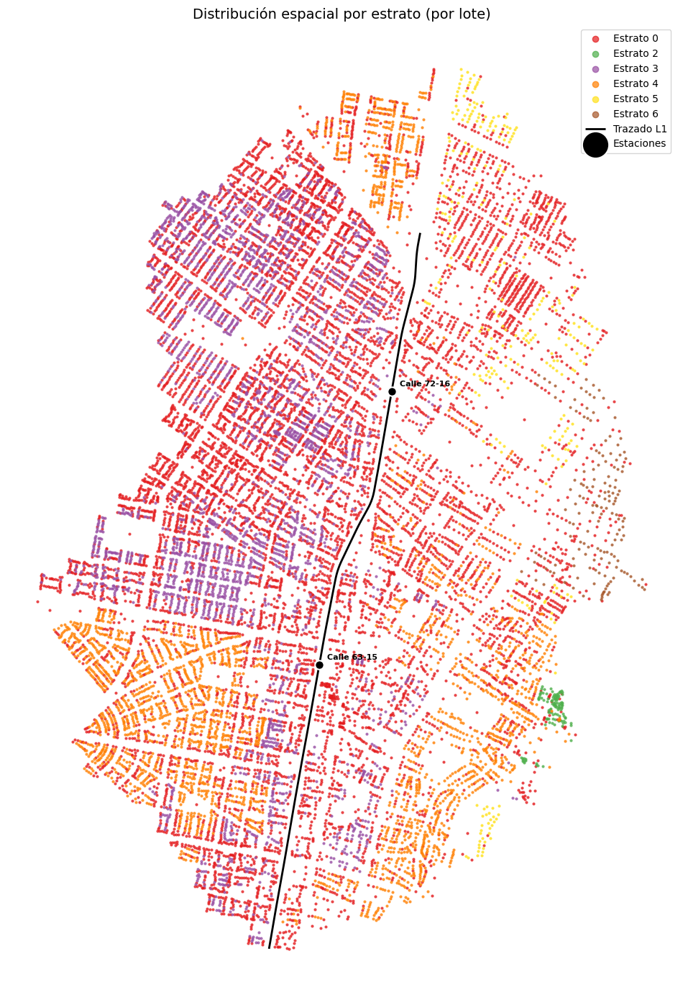

In [ ]:
colores_estrato_vivo = {
    0: '#e41a1c', 1: '#377eb8', 2: '#4daf4a', 3: '#984ea3',
    4: '#ff7f00', 5: '#ffe119', 6: '#a65628',
}

fig, ax = plt.subplots(figsize=(12, 14))
for est, color in colores_estrato_vivo.items():
    m = df_modelo_mask['estrato_int'] == est
    if m.sum() == 0:
        continue
    ax.scatter(cx_arr[m.values], cy_arr[m.values], c=color, s=4, alpha=0.7, label=f'Estrato {est}')
add_metro_layers(ax)
ax.legend(fontsize=10, loc='upper right', markerscale=3)
ax.set_title('Distribución espacial por estrato (por lote)', fontsize=14)
ax.set_axis_off()
plt.tight_layout()
plt.show()

### Mapa 2 — Distribución espacial Comercial vs. Residencial (Folium)


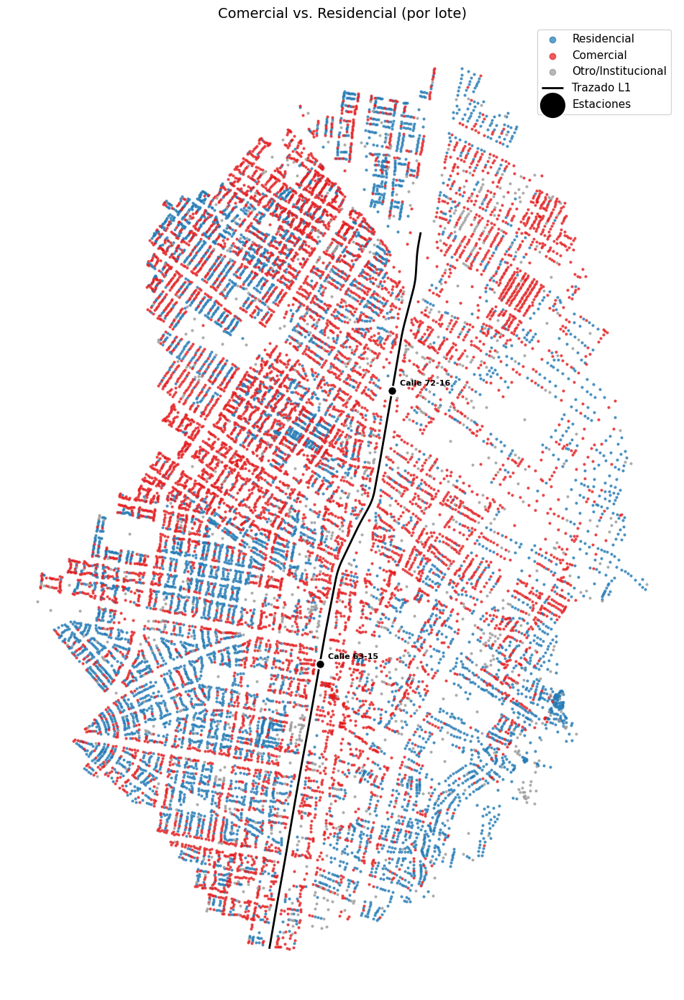

In [ ]:
colores_tipo_vivo = {
    'Residencial': '#1f78b4', 'Comercial': '#e31a1c', 'Otro/Institucional': '#999999',
}

fig, ax = plt.subplots(figsize=(12, 14))
for tipo, color in colores_tipo_vivo.items():
    m = df_modelo_mask['tipo_general'] == tipo
    ax.scatter(cx_arr[m.values], cy_arr[m.values], c=color, s=4, alpha=0.7, label=tipo)
add_metro_layers(ax)
ax.legend(fontsize=11, loc='upper right', markerscale=3)
ax.set_title('Comercial vs. Residencial (por lote)', fontsize=14)
ax.set_axis_off()
plt.tight_layout()
plt.show()

### Mapa 4 — PH vs. NPH dominante por barrio (Folium)


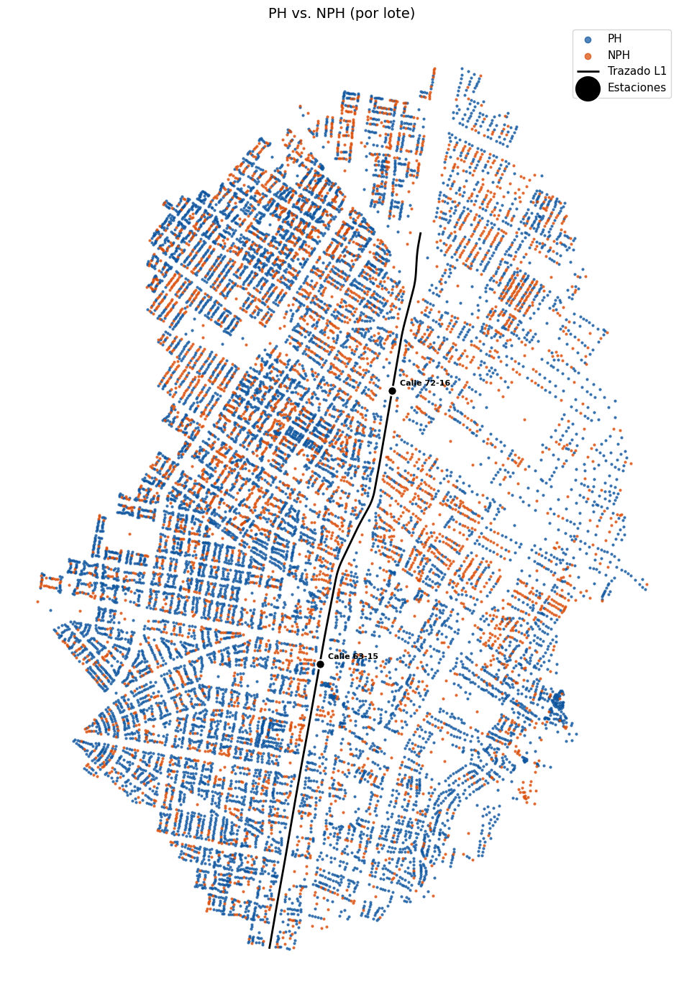

In [ ]:
colores_ph = {1: '#08519c', 0: '#d94801'}
etiquetas_ph = {1: 'PH', 0: 'NPH'}

fig, ax = plt.subplots(figsize=(12, 14))
for val, color in colores_ph.items():
    m = df_modelo_mask['ph_bin'] == val
    ax.scatter(cx_arr[m.values], cy_arr[m.values], c=color, s=4, alpha=0.7, label=etiquetas_ph[val])
add_metro_layers(ax)
ax.legend(fontsize=11, loc='upper right', markerscale=3)
ax.set_title('PH vs. NPH (por lote)', fontsize=14)
ax.set_axis_off()
plt.tight_layout()
plt.show()

### ¿El destino "Comercio Corredor Comercial" refleja el uso real?

Contraste puntual entre clasificación catastral y uso observado: de los lotes cuyo *destino* está catalogado como Comercio Corredor Comercial, ¿qué proporción tiene efectivamente un *uso* habitacional o comercial? Es evidencia directa de que destino y uso no siempre coinciden, motivando por qué el notebook distingue entre ambas variables en vez de usar solo el destino catastral.


In [ ]:
# ── ¿El destino "Comercio Corredor Comercial" refleja uso real? ───────────
lotes_corredor = df_modelo_mask[df_modelo_mask['destino_cat'] == 'Comercio Corredor Comercial']

print(f'Lotes con destino Comercio Corredor Comercial: {len(lotes_corredor):,}')
print()
print('Distribución de USO real dentro de esos lotes:')
uso_dentro_corredor = lotes_corredor['uso_cat'].value_counts(normalize=True) * 100
display(uso_dentro_corredor.head(15))

# Agrupado a nivel más simple: ¿cuántos tienen uso habitacional vs. comercial real?
uso_habitacional = lotes_corredor['uso_cat'].str.contains('Habitacional', case=False, na=False)
uso_comercial = lotes_corredor['uso_cat'].str.contains('Comercial|Comercio|Oficinas|Bodega', case=False, na=False)

print(f'\n% con uso Habitacional a pesar del destino comercial: {uso_habitacional.mean()*100:.1f}%')
print(f'% con uso Comercial/Oficinas/Bodega (consistente con el destino): {uso_comercial.mean()*100:.1f}%')
print(f'% con otro tipo de uso: {(~uso_habitacional & ~uso_comercial).mean()*100:.1f}%')

Lotes con destino Comercio Corredor Comercial: 6,138

Distribución de USO real dentro de esos lotes:


,proportion
uso_cat,
Corredor Comercial en NPH,27.142392
Habitacional menor o igual a 3 pisos en NPH,25.464321
Oficinas y Consultorios en NPH,14.858260
Depósitos de Almacenamiento en NPH,7.559466
Bodega de Almacenamiento en NPH,5.522972
Oficinas y Consultorios en PH,3.861193
Habitacional mayor o igual a 4 pisos en NPH,2.769632
Industria artesanal,1.889866
Bodega Económica,1.840991



% con uso Habitacional a pesar del destino comercial: 28.6%
% con uso Comercial/Oficinas/Bodega (consistente con el destino): 57.1%
% con otro tipo de uso: 14.4%


Recalculo del conteo de lotes por categoría de destino (misma lógica que antes), usado como insumo de las celdas de caracterización siguientes.


In [ ]:
dest_cols = [c for c in df_modelo.columns if c.startswith('dest_')]
conteo_dest = df_modelo[dest_cols].sum().sort_values(ascending=False)
conteo_dest['BASE'] = len(df_modelo) - df_modelo[dest_cols].sum(axis=1).sum()
print(conteo_dest)

dest_Comercio Corredor Comercial    6138
dest_Comercio Puntual               2356
dest_Dotacional Privado              549
dest_Parqueaderos                    155
dest_Otros                           151
dest_Urbanizado No Edificado         145
dest_Dotacional Público               88
dest_Comercio Centro Comercial        36
BASE                                6995
dtype: int64


In [ ]:
uso_cols = [c for c in df_modelo.columns if c.startswith('uso_')]
conteo_uso = df_modelo[uso_cols].sum().sort_values(ascending=False)
conteo_uso['BASE'] = len(df_modelo) - df_modelo[uso_cols].sum(axis=1).sum()
print(conteo_uso)

uso_Habitacional menor o igual a 3 pisos en NPH    6381
uso_Oficinas y Consultorios en NPH                 2439
uso_Corredor Comercial en NPH                      1683
uso_Habitacional mayor o igual a 4 pisos en PH     1610
uso_Depósitos de Almacenamiento en NPH              673
uso_Bodega de Almacenamiento en NPH                 536
uso_Habitacional mayor o igual a 4 pisos en NPH     357
uso_Parqueadero Cubierto en PH                      321
uso_Oficinas y Consultorios en PH                   274
uso_Institucional Puntual                           212
uso_Industria artesanal                             202
uso_Bodega Económica                                196
uso_Colegios y Universidades de 1 a 3 pisos         157
uso_Comercio Puntual en NPH                         132
uso_Moteles Amoblado y Residencias en NPH           115
uso_Restaurantes en NPH                             108
uso_Oficinas en Bodegas y/o Industrias en NPH       102
uso_Corredor Comercial en PH                    

### Zoom geográfico en Calle 63-15: metro vs. viaducto

Repite la comparación visual metro-vs-viaducto de la Sección 10, pero recortada a un radio de 700 m alrededor de la estación Calle 63-15 — el acercamiento necesario para distinguir las "bolsas" de contraste que a escala de todo el corredor se ven como manchas pequeñas.


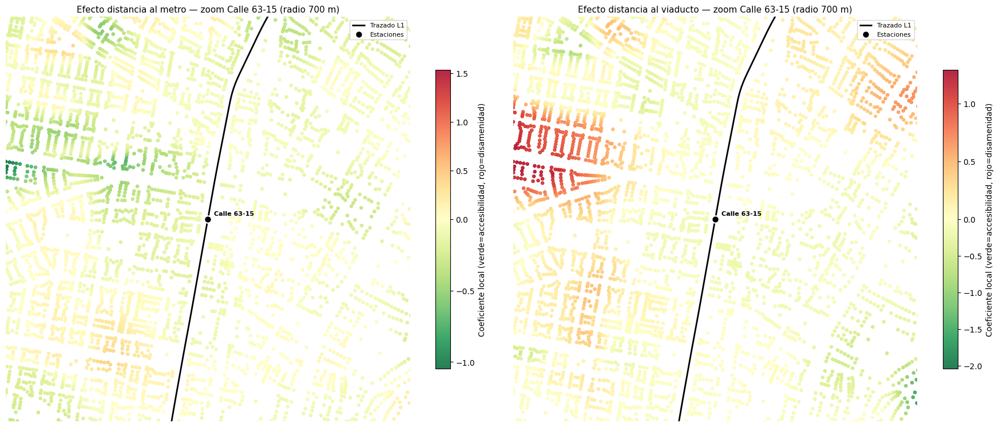

In [ ]:
# ── ZOOM: CALLE 63-15 — CONTRASTE LOCAL METRO VS ENTORNO ───────────────────
est_63 = gdf_estaciones[gdf_estaciones['RefName'].str.contains('63')].geometry.centroid.iloc[0]
cx_63, cy_63 = est_63.x, est_63.y

RADIO_ZOOM = 700  # metros — cubre las dos bolsas visuales a lado y lado de la estación

fig, axes = plt.subplots(1, 2, figsize=(18, 9))

for ax, var, titulo in zip(
    axes,
    ['log_dist_estacion_metro_m', 'log_dist_viaducto_m'],
    ['Efecto distancia al metro', 'Efecto distancia al viaducto']
):
    coefs = coef_df[var].values
    vmin  = np.percentile(coefs, 2)
    vmax  = np.percentile(coefs, 98)
    norm  = TwoSlopeNorm(vmin=vmin, vcenter=0, vmax=vmax) if vmin < 0 < vmax else None

    sc = ax.scatter(cx_arr, cy_arr, c=np.clip(coefs, vmin, vmax),
                    cmap='RdYlGn_r', norm=norm, s=14, alpha=0.85)
    plt.colorbar(sc, ax=ax, label='Coeficiente local (verde=accesibilidad, rojo=disamenidad)', shrink=0.6)
    add_metro_layers(ax)

    ax.set_xlim(cx_63 - RADIO_ZOOM, cx_63 + RADIO_ZOOM)
    ax.set_ylim(cy_63 - RADIO_ZOOM, cy_63 + RADIO_ZOOM)
    ax.set_title(f'{titulo} — zoom Calle 63-15 (radio {RADIO_ZOOM} m)', fontsize=11)
    ax.legend(loc='upper right', fontsize=8)
    ax.set_axis_off()

plt.tight_layout()
plt.show()

### Lotes que divergen de su entorno inmediato

Para cada lote, compara su coeficiente local de metro contra el promedio ponderado de sus 10 vecinos más cercanos (usando la misma `W_final` row-standardized del SEM/SAR/SARAR — el "rezago espacial" del coeficiente). Un lote es "divergente" cuando su signo se opone al de su entorno: son los puntos que rompen visualmente el patrón dominante (una mancha de un color rodeada del color opuesto). Se caracterizan los lotes divergentes vs. el resto dentro de la ventana de zoom de Calle 63-15 (estrato, % PH, avalúo, composición de destino).


In [ ]:
# ── LOTES QUE DIVERGEN DE SU ENTORNO INMEDIATO (ZOOM CALLE 63-15) ──────────
# Comparamos el coeficiente propio de cada lote contra el promedio de sus
# k=10 vecinos mas cercanos (mismo W_final usado en SEM/SAR/SARAR, row-
# standardized). Un lote "divergente" es uno cuyo signo se opone al de su
# entorno -- son los puntos que rompen visualmente el patron dominante
# (la mancha naranja en zona verde, o la mancha verde en zona naranja/roja).

coef_metro_arr = coef_df['log_dist_estacion_metro_m'].values
lag_metro = W_final.sparse @ coef_metro_arr  # promedio ponderado de vecinos

df_zoom = df_modelo_mask.copy()
df_zoom['coef_metro_local']  = coef_metro_arr
df_zoom['lag_metro_vecinos'] = lag_metro
df_zoom['divergente'] = np.sign(df_zoom['coef_metro_local']) != np.sign(df_zoom['lag_metro_vecinos'])

mask_zoom_63 = (
    df_zoom['cx'].between(cx_63 - RADIO_ZOOM, cx_63 + RADIO_ZOOM) &
    df_zoom['cy'].between(cy_63 - RADIO_ZOOM, cy_63 + RADIO_ZOOM)
)
sub_zoom = df_zoom[mask_zoom_63]

print(f'Lotes en la ventana Calle 63-15 (radio {RADIO_ZOOM} m): {len(sub_zoom):,}')
print(f'  Divergentes de su entorno: {sub_zoom["divergente"].sum():,} '
      f'({sub_zoom["divergente"].mean()*100:.1f}%)')

caracterizacion = (
    sub_zoom.groupby('divergente')
    .agg(
        n            = ('coef_metro_local', 'count'),
        coef_prom    = ('coef_metro_local', 'mean'),
        estrato_prom = ('PreEstrato', 'mean'),
        pct_ph       = ('ph_bin', 'mean'),
        avaluo_prom  = (TARGET, 'mean'),
    ).round(3)
)
display(caracterizacion)

print('\nComposición de destino_cat, divergentes vs. resto (% dentro de cada grupo):')
display(
    (pd.crosstab(sub_zoom['divergente'], sub_zoom['destino_cat'], normalize='index') * 100).round(1)
)

Lotes en la ventana Calle 63-15 (radio 700 m): 4,275
  Divergentes de su entorno: 108 (2.5%)


,n,coef_prom,estrato_prom,pct_ph,avaluo_prom
divergente,,,,,
False,4167,-0.076,1.563,0.734,20.416
True,108,0.003,1.537,0.676,20.565



Composición de destino_cat, divergentes vs. resto (% dentro de cada grupo):


destino_cat,Comercio Centro Comercial,Comercio Corredor Comercial,Comercio Puntual,Dotacional Privado,Dotacional Público,Otros,Parqueaderos,Residencial,Urbanizado No Edificado
divergente,,,,,,,,,
False,0.5,32.1,12.7,3.8,0.7,0.5,1.0,47.7,1.0
True,0.0,22.2,15.7,7.4,3.7,1.9,1.9,46.3,0.9


Mapa interactivo (`plotly`) de los coeficientes locales del metro sobre todo el corredor, con tooltips por lote (`barmanpre`, estación, destino, estrato) — pensado para identificar visual e interactivamente las coordenadas exactas de zonas de interés detectadas en los mapas estáticos anteriores.


In [ ]:
# ── MAPA INTERACTIVO — IDENTIFICAR COORDENADAS EXACTAS DE LAS ZONAS ────────
import plotly.express as px

df_plot = df_modelo_mask.copy()
df_plot['coef_metro_local'] = coef_df['log_dist_estacion_metro_m'].values

fig = px.scatter(
    df_plot,
    x='cx', y='cy',
    color='coef_metro_local',
    color_continuous_scale='RdYlGn_r',
    range_color=[df_plot['coef_metro_local'].quantile(0.02),
                 df_plot['coef_metro_local'].quantile(0.98)],
    hover_data=['barmanpre', 'coef_metro_local', 'estacion', 'destino_cat', 'PreEstrato'],
    width=900, height=900,
)

# Superponer estaciones para orientarte
centroides = gdf_estaciones.geometry.centroid
fig.add_scatter(
    x=centroides.x, y=centroides.y, mode='markers+text',
    text=gdf_estaciones['RefName'], textposition='top center',
    marker=dict(size=12, color='black'), name='Estaciones'
)

fig.update_yaxes(scaleanchor='x', scaleratio=1)  # evita distorsión de aspecto
fig.show()